# Performing a simple soil moisture water budget

In [1]:
import warnings
from pathlib import Path
import itertools

import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import statsmodels.api as sm
from scipy import stats
from statsmodels.formula.api import ols
import seaborn as sns

from utils import *
from methodology import *

# Data Wrangling

## NF

In [3]:
soil_data_dir = Path("/cluster/alcova/wycehg/TempData/Bretfeld Mario/Chimney/Data/data_xfer/soils/BB-NF")
cs616_files = soil_data_dir.glob("TOA5*CS616*.dat")
dfs = []
cs616 = pd.concat([
   (
        pd.read_csv(f, skiprows=[0, 2, 3], parse_dates=["TIMESTAMP"])
        .filter(regex="^WC.+_Avg$|TIMESTAMP", axis=1)
        .rename(
            columns={'WC_C5cm_Avg':"VWC_C-5",
                     'WC_C10cm_Avg':"VWC_C-10",
                     'WC_C15cm_Avg':"VWC_C-15",
                     'WC_C30cm_Avg':"VWC_C-30",
                     'WC_C50cm_Avg':"VWC_C-50"}
        )
    )
    for f in cs616_files
])

hydra_files = soil_data_dir.glob("TOA5*HydraProbe*.dat")
hydra = pd.concat([
    pd.read_csv(f, skiprows=[0, 2, 3], parse_dates=["TIMESTAMP"])
    .filter(regex='^Soil_Moist.+_Avg|TIMESTAMP', axis=1)
    .rename(
        columns={'Soil_Moist_A5cm_Avg':"VWC_A-5", 
                 'Soil_Moist_A10cm_Avg':"VWC_A-10",
                 'Soil_Moist_A15cm_Avg':"VWC_A-15", 
                 'Soil_Moist_A30cm_Avg':"VWC_A-30", 
                 'Soil_Moist_A50cm_Avg':"VWC_A-50",
                 'Soil_Moist_B5cm_Avg':"VWC_B-5", 
                 'Soil_Moist_B10cm_Avg':"VWC_B-10", 
                 'Soil_Moist_B15cm_Avg':"VWC_B-15",
                 'Soil_Moist_B30cm_Avg':"VWC_B-30", 
                 'Soil_Moist_B50cm_Avg':"VWC_B-50"}
    )
    for f in hydra_files
])

soil_nf = (
    hydra
    .merge(cs616, on="TIMESTAMP", how="outer")
    .sort_values("TIMESTAMP")
    .drop_duplicates(subset="TIMESTAMP")
    .set_index("TIMESTAMP")
    .interpolate(limit=48*7)
)


soil_nf = soil_nf.reset_index().sort_values("TIMESTAMP").set_index("TIMESTAMP")
# something is wrong with the data from pit B. Drop it.
soil_nf = soil_nf.filter(regex="VWC_[AC]")

# filter for field capacity + realistic values
theta_s = soil_nf.filter(regex="VWC").quantile([0.97]).max(1).values[0]
field_capacity = theta_s*0.8

pits = sorted(list(set([c.split("_")[-1][0] for c in soil_nf.columns])))
soil_nf = extrapolate_vwc(soil_nf, pits=pits, method="power")


depths = [5, 10, 15, 30, 50, 75, 100]
soil_nf = compute_s(soil_nf, depths, pits, field_capacity)


h_nf = soil_nf.filter(regex=f"h_[ABC]-[0-9]+$").copy()
vwc_nf = soil_nf.filter(regex=f"VWC_[ABC]-[0-9]+$").copy()

fig, axs = plt.subplots(len(pits), 2, figsize=(15,10), sharex="col")
axs = np.atleast_1d(axs)
for i, pit in enumerate(pits):
    h_nf.filter(regex=f"h_{pit}").plot(ax=axs[i, 0], legend=False)
    axs[i, 0].set_ylabel("Total Water Content (m)")

    vwc_nf.filter(regex=f"VWC_{pit}").plot(ax=axs[i, 1], legend=False)
    axs[i, 1].set_ylabel("VWC ($m^3/m^3$)")
    axs[i, 0].set_title(f"Pit {pit}")
    axs[i, 1].set_title(f"Pit {pit}")
axs[0, 0].legend(title="Depth (cm)", labels=depths);
    
soil_nf.to_csv("soil_nf.csv")

  2%|▏         | 1471/61027 [00:02<01:44, 570.52it/s]


KeyboardInterrupt: 

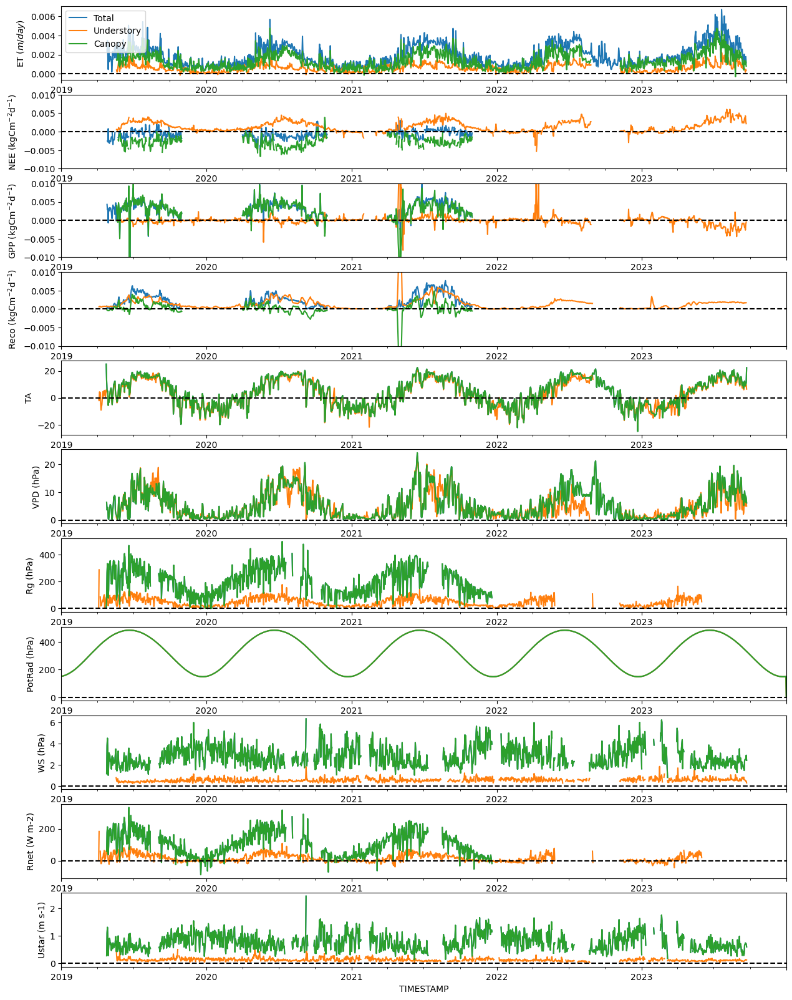

In [10]:
#### Ecosystem
flux_nf = load_flux_data(Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-NF-17m_proc_.tsv')

flux_nf["NEE"] = np.where((flux_nf.index.year < 2022) & (flux_nf.index.month.isin([4, 5, 6, 7, 8, 9, 10])), flux_nf["NEE"], np.nan)
flux_nf["GPP"] = np.where((flux_nf.index.year < 2022) & (flux_nf.index.month.isin([4, 5, 6, 7, 8, 9, 10])), flux_nf["GPP"], np.nan)
flux_nf["Reco"] = np.where((flux_nf.index.year < 2022) & (flux_nf.index.month.isin([4, 5, 6, 7, 8, 9, 10])), flux_nf["Reco"], np.nan)
flux_nf["NEE"] = np.where(flux_nf["NEE"].abs() > 0.03, np.nan, flux_nf["NEE"])
flux_nf["GPP"] = np.where(flux_nf["NEE"].abs() > 0.03, np.nan, flux_nf["GPP"])
flux_nf["Reco"] = np.where(flux_nf["NEE"].abs() > 0.03, np.nan, flux_nf["Reco"])

compare = get_rg_ws(
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-NF-17m_eddypro_fullout.csv'), 
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-NF-17m_proc_.tsv',
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-NF-17m_Rnet.csv'), 
)
compare["Rg"] = np.where(compare.index.year < 2022, compare["Rg"], np.nan)
compare["Rnet"] = np.where(compare.index.year < 2022, compare["Rnet"], np.nan)
flux_nf = flux_nf.merge(compare, left_index=True, right_index=True, how="outer")

#### Understory
flux_nf_under = load_flux_data(Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-NF-3m_proc_.tsv')
flux_nf_under["NEE"] = np.where(flux_nf_under["NEE"].abs() > 0.03, np.nan, flux_nf_under["NEE"])
flux_nf_under["GPP"] = np.where(flux_nf_under["NEE"].abs() > 0.03, np.nan, flux_nf_under["GPP"])
flux_nf_under["Reco"] = np.where(flux_nf_under["NEE"].abs() > 0.03, np.nan, flux_nf_under["Reco"])

flux_nf_under["NEE"] = np.where(~((flux_nf_under.index.year == 2021) & (flux_nf.index.month == 2)), flux_nf_under["NEE"], np.nan)
flux_nf_under["GPP"] = np.where(~((flux_nf_under.index.year == 2021) & (flux_nf.index.month == 2)), flux_nf_under["GPP"], np.nan)
flux_nf_under["Reco"] = np.where(~((flux_nf_under.index.year == 2021) & (flux_nf.index.month == 2)), flux_nf_under["Reco"], np.nan)
# flux_nf_under["NEE"] = np.where((flux_nf_under.index <= "2022-04-05") | (flux_nf_under.index >= "2022-04-15") , flux_nf_under["NEE"], np.nan)
# flux_nf_under["GPP"] = np.where((flux_nf_under.index <= "2022-04-05") | (flux_nf_under.index >= "2022-04-15") , flux_nf_under["GPP"], np.nan)
# flux_nf_under["Reco"] = np.where((flux_nf_under.index <= "2022-04-05") | (flux_nf_under.index >= "2022-04-15") , flux_nf_under["Reco"], np.nan)


compare = get_rg_ws(
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-NF-3m_eddypro_fullout.csv'), 
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-NF-3m_proc_.tsv',
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-NF-3m_Rnet.csv'), 
)
flux_nf_under = flux_nf_under.merge(compare, left_index=True, right_index=True, how="outer")

#### Canopy
flux_nf_can = flux_nf.copy()
flux_nf_can[["ET", "NEE", "GPP", "Reco"]] = flux_nf[["ET", "NEE", "GPP", "Reco"]] - flux_nf_under[["ET", "NEE", "GPP", "Reco"]]


fig, axs = plt.subplots(11, 1, figsize=(15, 20))

(flux_nf.filter(regex="ET").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel="ET ($m/day$)", ax=axs[0]);
(flux_nf_under.filter(regex="ET").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel="ET ($m/day$)", ax=axs[0]);
(flux_nf_can.filter(regex="ET").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel="ET ($m/day$)", ax=axs[0]);

(flux_nf.filter(regex="NEE").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[1], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_nf_under.filter(regex="NEE").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[1], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_nf_can.filter(regex="NEE").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[1], legend=False, ylim=(-0.5/50, 0.5/50));

(flux_nf.filter(regex="GPP").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[2], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_nf_under.filter(regex="GPP").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[2], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_nf_can.filter(regex="GPP").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[2], legend=False, ylim=(-0.5/50, 0.5/50));

(flux_nf.filter(regex="Reco").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"Reco ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[3], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_nf_under.filter(regex="Reco").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"Reco ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[3], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_nf_can.filter(regex="Reco").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"Reco ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[3], legend=False, ylim=(-0.5/50, 0.5/50));

flux_nf.filter(regex="TA").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="TA", ax=axs[4], legend=False);
flux_nf_under.filter(regex="TA").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="TA", ax=axs[4], legend=False);
flux_nf_can.filter(regex="TA").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="TA", ax=axs[4], legend=False);

flux_nf.filter(regex="VPD").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="VPD (hPa)", ax=axs[5], legend=False);
flux_nf_under.filter(regex="VPD").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="VPD (hPa)", ax=axs[5], legend=False);
flux_nf_can.filter(regex="VPD").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="VPD (hPa)", ax=axs[5], legend=False);

flux_nf.filter(regex="Rg").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rg (hPa)", ax=axs[6], legend=False);
flux_nf_under.filter(regex="Rg").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rg (hPa)", ax=axs[6], legend=False);
flux_nf_can.filter(regex="Rg").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rg (hPa)", ax=axs[6], legend=False);

flux_nf.filter(regex="PotRad").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="PotRad (hPa)", ax=axs[7], legend=False);
flux_nf_under.filter(regex="PotRad").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="PotRad (hPa)", ax=axs[7], legend=False);
flux_nf_can.filter(regex="PotRad").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="PotRad (hPa)", ax=axs[7], legend=False);

flux_nf.filter(regex="WS").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="WS (hPa)", ax=axs[8], legend=False);
flux_nf_under.filter(regex="WS").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="WS (hPa)", ax=axs[8], legend=False);
flux_nf_can.filter(regex="WS").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="WS (hPa)", ax=axs[8], legend=False);

flux_nf.filter(regex="Rnet").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rnet (W m-2)", ax=axs[9], legend=False);
flux_nf_under.filter(regex="Rnet").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rnet (W m-2)", ax=axs[9], legend=False);
flux_nf_can.filter(regex="Rnet").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rnet (W m-2)", ax=axs[9], legend=False);

flux_nf.filter(regex="Ustar").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Ustar (m s-1)", ax=axs[10], legend=False);
flux_nf_under.filter(regex="Ustar").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Ustar (m s-1)", ax=axs[10], legend=False);
flux_nf_can.filter(regex="Ustar").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Ustar (m s-1)", ax=axs[10], legend=False);

axs[0].legend(["Total", "Understory", "Canopy"])

for ax in axs:
    ax.hlines(0, *ax.get_xlim(), "k", "--")

In [ ]:
flux_data["zm-NF_eco"] = 18
flux_data["zm-NF_und"] = 3

flux_data["zc-NF_eco"] = 16
flux_data["zc-NF_und"] = 0.1

In [84]:
nf_data = flux_nf.merge(soil_nf, left_index=True, right_index=True, how="inner")
nf_data.to_csv("NF_data.csv")

nf_under_data = flux_nf_under.merge(soil_nf, left_index=True, right_index=True, how="inner")
nf_under_data.to_csv("NF_understory_data.csv")

nf_can_data = flux_nf_can.merge(soil_nf, left_index=True, right_index=True, how="inner")
nf_can_data.to_csv("NF_canopy_data.csv")

## LSF

100%|██████████| 62873/62873 [03:21<00:00, 311.53it/s]


A
B
C


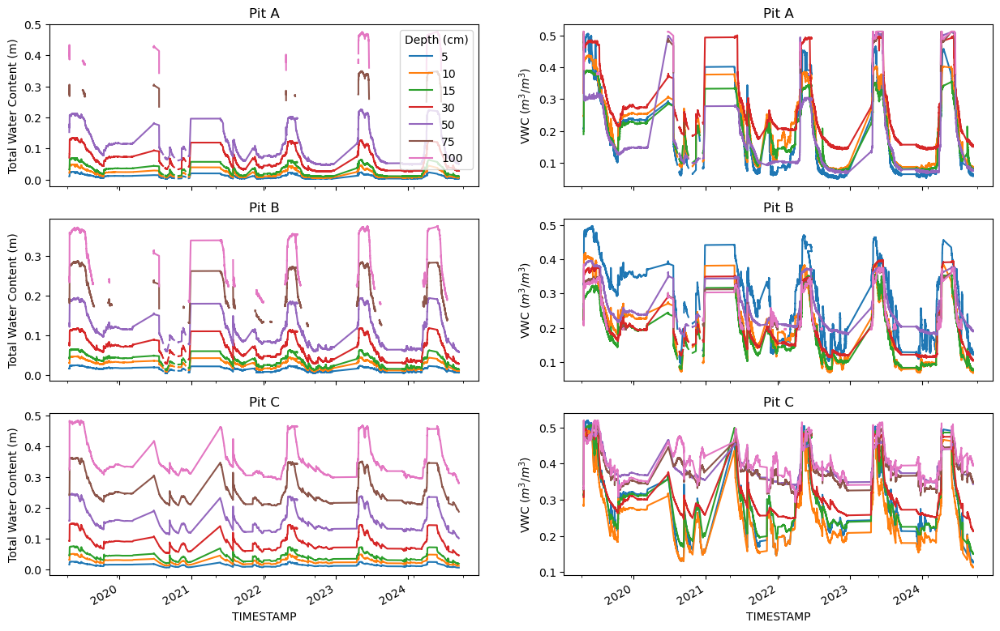

In [33]:
soil_data_dir = Path("/cluster/alcova/wycehg/TempData/Bretfeld Mario/Chimney/Data/data_xfer/soils/BB-UF")
cs616_files = soil_data_dir.glob("TOA5*CS616*.dat")
dfs = []
cs616 = pd.concat([
   (
        pd.read_csv(f, skiprows=[0, 2, 3], parse_dates=["TIMESTAMP"])
        .filter(regex="^WC.+_Avg$|TIMESTAMP", axis=1)
        .rename(
            columns={'WC_C5cm_Avg':"VWC_C-5",
                     'WC_C10cm_Avg':"VWC_C-10",
                     'WC_C15cm_Avg':"VWC_C-15",
                     'WC_C30cm_Avg':"VWC_C-30",
                     'WC_C50cm_Avg':"VWC_C-50"}
        )
    )
    for f in cs616_files
])

hydra_files = soil_data_dir.glob("TOA5*tevens*.dat")
hydra = pd.concat([
    pd.read_csv(f, skiprows=[0, 2, 3], parse_dates=["TIMESTAMP"])
    .filter(regex='^Soil_Moist.+_Avg|TIMESTAMP', axis=1)
    .rename(
        columns={'Soil_Moist_A5cm_Avg':"VWC_A-5", 
                 'Soil_Moist_A10cm_Avg':"VWC_A-10",
                 'Soil_Moist_A15cm_Avg':"VWC_A-15", 
                 'Soil_Moist_A30cm_Avg':"VWC_A-30", 
                 'Soil_Moist_A50cm_Avg':"VWC_A-50",
                 'Soil_Moist_B5cm_Avg':"VWC_B-5", 
                 'Soil_Moist_B10cm_Avg':"VWC_B-10", 
                 'Soil_Moist_B15cm_Avg':"VWC_B-15",
                 'Soil_Moist_B30cm_Avg':"VWC_B-30", 
                 'Soil_Moist_B50cm_Avg':"VWC_B-50"}
    )
    for f in hydra_files
])

soil_uf = (
    hydra
    .merge(cs616, on="TIMESTAMP", how="outer")
    .sort_values("TIMESTAMP")
    .set_index("TIMESTAMP")
)

soil_uf = soil_uf.reset_index().sort_values("TIMESTAMP").set_index("TIMESTAMP")

# fix clock error
soil_uf = soil_uf.set_index(np.where(soil_uf.index.year == 2023, soil_uf.index + pd.Timedelta("69d") + pd.Timedelta("3h"), soil_uf.index))
soil_uf = soil_uf.set_index(np.where((soil_uf.index.year == 2022) & (soil_uf.index.month < 6), soil_uf.index + pd.Timedelta("18d") + pd.Timedelta("16h"), soil_uf.index))

soil_uf = (
    soil_uf
    .reset_index()
    .rename(columns=dict(index="TIMESTAMP"))
    .drop_duplicates(subset="TIMESTAMP")
    .set_index("TIMESTAMP")
    .interpolate(limit=48*7)
)

# filter for field capacity + realistic values
theta_s = soil_uf.filter(regex="VWC").quantile([0.97]).max(1).values[0]
field_capacity = theta_s*0.8

pits = sorted(list(set([c.split("_")[-1][0] for c in soil_uf.columns])))
soil_uf = extrapolate_vwc(soil_uf, method="power")

depths = [5, 10, 15, 30, 50, 75, 100]
soil_uf = compute_s(soil_uf, depths, pits, field_capacity)

h_uf = soil_uf.filter(regex=f"h_[ABC]-[0-9]+$").copy()
vwc_uf = soil_uf.filter(regex=f"VWC_[ABC]-[0-9]+$").copy()
fig, axs = plt.subplots(len(pits), 2, figsize=(15,10), sharex="col")
axs = np.atleast_1d(axs)
for i, pit in enumerate(pits):
    h_uf.filter(regex=f"h_{pit}").plot(ax=axs[i, 0], legend=False)
    axs[i, 0].set_ylabel("Total Water Content (m)")

    vwc_uf.filter(regex=f"VWC_{pit}").plot(ax=axs[i, 1], legend=False)
    axs[i, 1].set_ylabel("VWC ($m^3/m^3$)")
    axs[i, 0].set_title(f"Pit {pit}")
    axs[i, 1].set_title(f"Pit {pit}")
axs[0, 0].legend(title="Depth (cm)", labels=depths)
# axs[0, 0].set_title("Total Moisture in Soil Column")
# axs[0, 1].set_title("Total Moisture in Soil Column")
    
soil_uf.to_csv("soil_uf.csv")

Getting ET data for UF is a little tricky. We don't have a tall tower, so we have to "extrapolate" from the no-burn site. Do do this, note that the total $ET$ of the ecosystem is given by $ET = ET_{\text{under}} + ET_{\text{canopy}}$. At LSF, we only have $ET_{\text{under}}$, but at NF, we have both $ET$ and $ET_{\text{under}}$. If we make the (admittedly bold) assumption that $ET_{\text{canopy}}$ is the same for both NF and LSF, we can approximate $ET$ for LSF as 

$$
ET_{\text{UF}} = ET_{\text{NF}} - ET_{\text{NF, under}} + ET_{\text{UF, under}}
$$


For a later analysis, we want to be able to make some predictions of soil moisture for depths deeper than 50cm by extrapolating. An exponential fit seems to be the best. Predict soil moisture within each pit down to 1m.

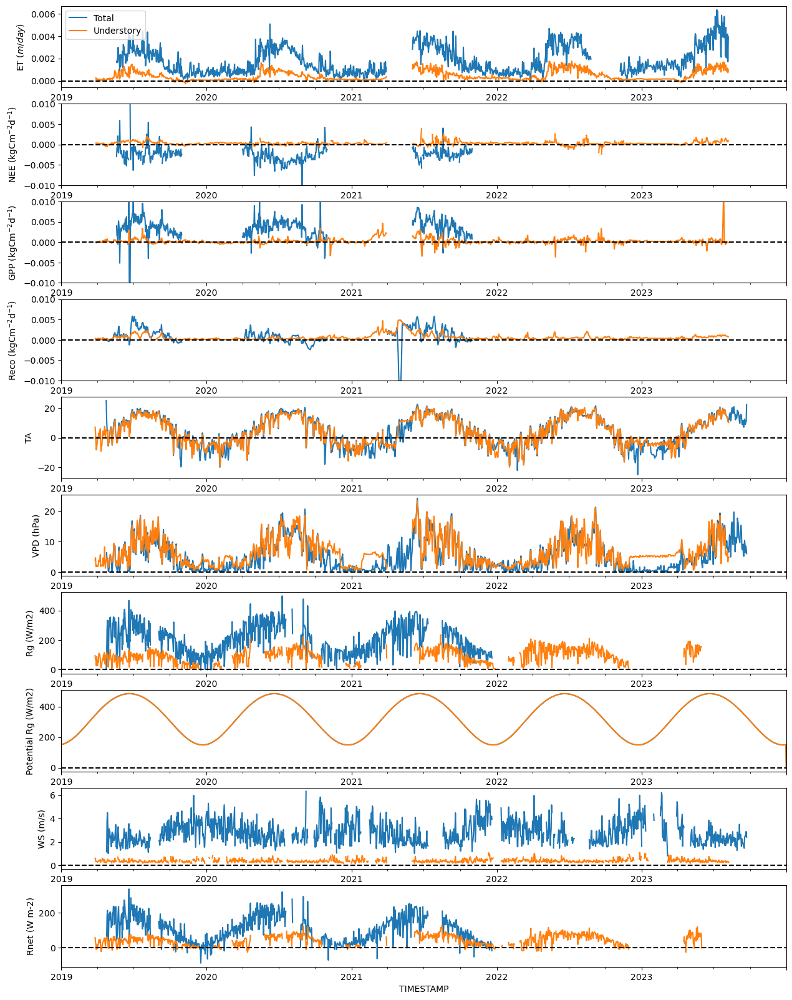

In [36]:
### understory
flux_uf_under = load_flux_data(Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-UF-3m_proc_.tsv')
compare = get_rg_ws(
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-UF-3m_eddypro_fullout.csv'), 
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-UF-3m_proc_.tsv',
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-UF-3m_Rnet.csv'), 
)
compare["Rg"] = compare["Rg"].where((compare["Rg"] > 0) & (compare["Rg"] < 5000))
compare["Rnet"] = compare["Rnet"].where((compare["Rnet"] > -500) & (compare["Rnet"] < 2000))

flux_uf_under["NEE"] = np.where(flux_uf_under["NEE"].abs() > 0.03, np.nan, flux_uf_under["NEE"])
flux_uf_under["GPP"] = np.where(flux_uf_under["NEE"].abs() > 0.03, np.nan, flux_uf_under["GPP"])
flux_uf_under["Reco"] = np.where(flux_uf_under["NEE"].abs() > 0.03, np.nan, flux_uf_under["Reco"])

flux_uf_under = flux_uf_under.merge(compare, left_index=True, right_index=True, how="outer")


# ecosystem
flux_uf = (
    flux_nf
    .merge(flux_uf_under, how="inner", left_index=True, right_index=True, suffixes=("_nf", "_uf_under"))
    .merge(flux_nf_under.rename(columns=dict(ET="ET_nf_under", NEE="NEE_nf_under", GPP="GPP_nf_under", Reco="Reco_nf_under", TA="TA_nf_under", VPD="VPD_nf_under")), how="inner", left_index=True, right_index=True)
)
flux_uf["ET"] = flux_uf["ET_nf"] - flux_uf["ET_nf_under"] + flux_uf["ET_uf_under"]
flux_uf["NEE"] = flux_uf["NEE_nf"] - flux_uf["NEE_nf_under"] + flux_uf["NEE_uf_under"]
flux_uf["GPP"] = flux_uf["GPP_nf"] - flux_uf["GPP_nf_under"] + flux_uf["GPP_uf_under"]
flux_uf["Reco"] = flux_uf["Reco_nf"] - flux_uf["Reco_nf_under"] + flux_uf["Reco_uf_under"]
flux_uf["VPD"] = flux_uf["VPD_nf"]
flux_uf["Rg"] = flux_uf["Rg_nf"]
flux_uf["Rnet"] = flux_uf["Rnet_nf"]
flux_uf["PotRad"] = flux_uf["PotRad_nf"]
flux_uf["WS"] = flux_uf["WS_nf"]
flux_uf["TA"] = flux_uf["TA_nf"]
flux_uf = flux_uf[["ET", "NEE", "GPP", "Reco", "VPD", "Rg", "Rnet", "PotRad", "WS", "TA"]]



fig, axs = plt.subplots(10, 1, figsize=(15, 20))

(flux_uf.filter(regex="ET").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel="ET ($m/day$)", ax=axs[0]);
(flux_uf_under.filter(regex="ET").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel="ET ($m/day$)", ax=axs[0]);

(flux_uf.filter(regex="NEE").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[1], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_uf_under.filter(regex="NEE").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[1], legend=False, ylim=(-0.5/50, 0.5/50));

(flux_uf.filter(regex="GPP").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[2], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_uf_under.filter(regex="GPP").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[2], legend=False, ylim=(-0.5/50, 0.5/50));

(flux_uf.filter(regex="Reco").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"Reco ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[3], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_uf_under.filter(regex="Reco").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"Reco ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[3], legend=False, ylim=(-0.5/50, 0.5/50));

flux_uf.filter(regex="TA").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="TA", ax=axs[4], legend=False);
flux_uf_under.filter(regex="TA").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="TA", ax=axs[4], legend=False);

flux_uf.filter(regex="VPD").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="VPD (hPa)", ax=axs[5], legend=False);
flux_uf_under.filter(regex="VPD").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="VPD (hPa)", ax=axs[5], legend=False);

flux_uf.filter(regex="Rg").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rg (W/m2)", ax=axs[6], legend=False);
flux_uf_under.filter(regex="Rg").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rg (W/m2)", ax=axs[6], legend=False);

flux_uf.filter(regex="PotRad").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Potential RG (W/m2)", ax=axs[7], legend=False);
flux_uf_under.filter(regex="PotRad").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Potential Rg (W/m2)", ax=axs[7], legend=False);

flux_uf.filter(regex="WS").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="WS (m/s)", ax=axs[8], legend=False);
flux_uf_under.filter(regex="WS").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="WS (m/s)", ax=axs[8], legend=False);

flux_uf.filter(regex="Rnet").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rnet (W m-2)", ax=axs[9], legend=False);
flux_uf_under.filter(regex="Rnet").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rnet (W m-2)", ax=axs[9], legend=False);

axs[0].legend(["Total", "Understory", "Canopy"])

for ax in axs:
    ax.hlines(0, *ax.get_xlim(), "k", "--")

In [37]:
uf_data = flux_uf.merge(soil_uf, left_index=True, right_index=True, how="inner")
uf_data.to_csv("./UF_data.csv")

uf_under_data = flux_uf_under.merge(soil_uf, left_index=True, right_index=True, how="inner")
uf_under_data.to_csv("./UF_understory_data.csv")

## HSF

100%|██████████| 104060/104060 [07:16<00:00, 238.36it/s]


A
B
C
D


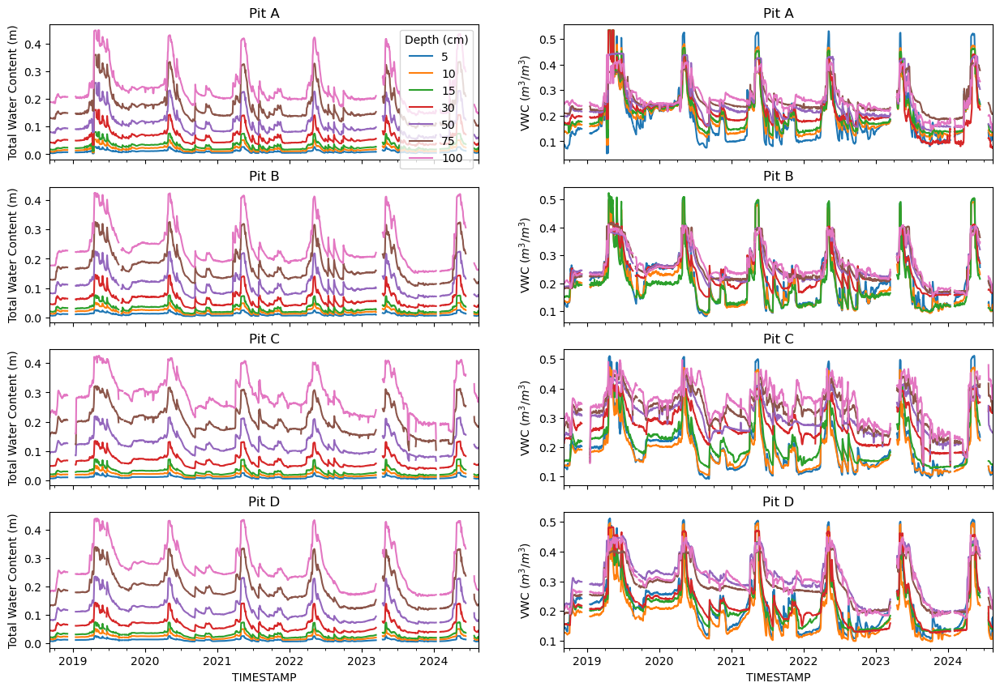

In [38]:
soil_data_dir = Path("/project/bbtrees/afox18/CP_Compound_Disturbance/soil-water-budget")
tdr_file = soil_data_dir / Path("TDR_v1_2_2018to2024_FINAL.csv")
dfs = []

tdr = pd.read_csv(tdr_file, skiprows=[1])
tdr["TIMESTAMP"] = pd.to_datetime(
    tdr["Year"].astype(str) 
    + "-" + tdr["Month"].astype(str) 
    + "-" + tdr["Day"].astype(str) 
    + " " + tdr["Hour"].astype(str) 
    + ":" + tdr["Min"].astype(str)
)

tdr = (
    tdr
    .filter(regex="^SWC_[ABCD]_[0-9]+cm|TIMESTAMP")
    .rename(columns={
        "SWC_A_05cm":"VWC_A-5",
        "SWC_A_10cm":"VWC_A-10",
        "SWC_A_15cm":"VWC_A-15",
        "SWC_A_30cm":"VWC_A-30",
        "SWC_A_50cm":"VWC_A-50",
        "SWC_A_75cm":"VWC_A-75",
        "SWC_B_05cm":"VWC_B-5",
        "SWC_B_10cm":"VWC_B-10",
        "SWC_B_15cm":"VWC_B-15",
        "SWC_B_30cm":"VWC_B-30",
        "SWC_B_50cm":"VWC_B-50",
        "SWC_B_75cm":"VWC_B-75",
        "SWC_C_05cm":"VWC_C-5",
        "SWC_C_10cm":"VWC_C-10",
        "SWC_C_15cm":"VWC_C-15",
        "SWC_C_30cm":"VWC_C-30",
        "SWC_C_50cm":"VWC_C-50",
        "SWC_C_75cm":"VWC_C-75",
        "SWC_D_05cm":"VWC_D-5",
        "SWC_D_10cm":"VWC_D-10",
        "SWC_D_15cm":"VWC_D-15",
        "SWC_D_30cm":"VWC_D-30",
        "SWC_D_50cm":"VWC_D-50",
        "SWC_D_75cm":"VWC_D-75",
    })
)

soil_sf = (
    tdr
    .sort_values("TIMESTAMP")
    .drop_duplicates(subset="TIMESTAMP")
    .set_index("TIMESTAMP")
    .interpolate(limit=48*7)
)

soil_sf = soil_sf.reset_index().sort_values("TIMESTAMP").set_index("TIMESTAMP")

# filter for field capacity + realistic values
theta_s = soil_sf.filter(regex="VWC").quantile([0.97]).max(1).values[0]
field_capacity = theta_s*0.82

pits = sorted(list(set([c.split("_")[-1][0] for c in soil_sf.columns])))
soil_sf = extrapolate_vwc(soil_sf, depths=[5, 10, 15, 30, 50, 75], pits=pits, method="power")
soil_sf = soil_sf.loc[~soil_sf.index.isna()]

depths = [5, 10, 15, 30, 50, 75, 100]
soil_sf = compute_s(soil_sf, depths, pits, field_capacity)

h_sf = soil_sf.filter(regex=f"h_[ABCD]-[0-9]+$").copy()
vwc_sf = soil_sf.filter(regex=f"VWC_[ABCD]-[0-9]+$").copy()
fig, axs = plt.subplots(len(pits), 2, figsize=(15,10), sharex="col")
axs = np.atleast_1d(axs)
for i, pit in enumerate(pits):
    h_sf.filter(regex=f"h_{pit}").groupby(pd.Grouper(freq="1d")).mean().plot(ax=axs[i, 0], legend=False)
    axs[i, 0].set_ylabel("Total Water Content (m)")

    vwc_sf.filter(regex=f"VWC_{pit}").groupby(pd.Grouper(freq="1d")).mean().plot(ax=axs[i, 1], legend=False)
    axs[i, 1].set_ylabel("VWC ($m^3/m^3$)")
    axs[i, 0].set_title(f"Pit {pit}")
    axs[i, 1].set_title(f"Pit {pit}")
axs[0, 0].legend(title="Depth (cm)", labels=depths);
    
soil_sf.to_csv("soil_sf.csv")

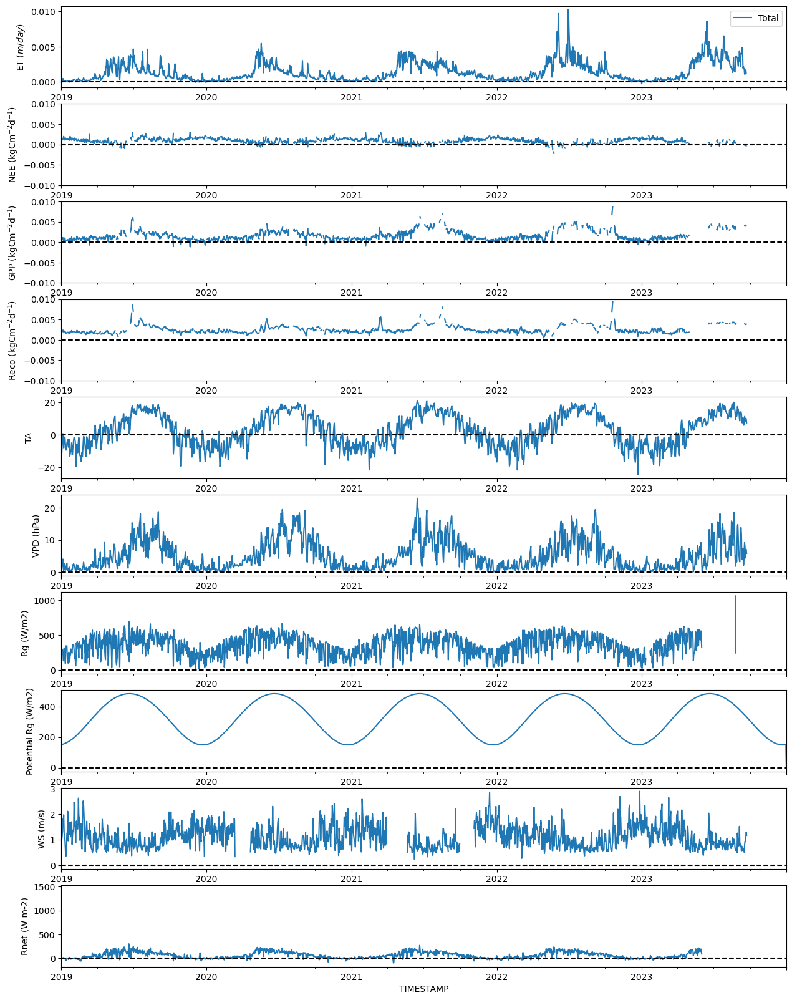

In [39]:
flux_sf = load_flux_data(Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-SF-4m_proc_.tsv')
flux_sf["NEE"] = flux_sf["NEE"].where(flux_sf["NEE"].abs() < 0.01)
flux_sf["GPP"] = flux_sf["GPP"].where(flux_sf["NEE"].abs() < 0.01)
flux_sf["Reco"] = flux_sf["Reco"].where(flux_sf["NEE"].abs() < 0.01)

compare = get_rg_ws(
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-SF-4m_eddypro_fullout.csv'), 
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-SF-4m_proc_.tsv',
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-SF-4m_Rnet.csv'), 
)
compare["Rg"] = compare["Rg"].where((compare["Rg"] > 0) & (compare["Rg"] < 2000))
compare["Rnet"] = compare["Rnet"].where((compare["Rnet"] > -500) & (compare["Rnet"] < 2000))
flux_sf = flux_sf.merge(compare, left_index=True, right_index=True, how="outer")

fig, axs = plt.subplots(10, 1, figsize=(15, 20))

(flux_sf.filter(regex="ET").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel="ET ($m/day$)", ax=axs[0]);

(flux_sf.filter(regex="NEE").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[1], legend=False, ylim=(-0.5/50, 0.5/50));

(flux_sf.filter(regex="GPP").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[2], legend=False, ylim=(-0.5/50, 0.5/50));

(flux_sf.filter(regex="Reco").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"Reco ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[3], legend=False, ylim=(-0.5/50, 0.5/50));

flux_sf.filter(regex="TA").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="TA", ax=axs[4], legend=False);

flux_sf.filter(regex="VPD").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="VPD (hPa)", ax=axs[5], legend=False);

flux_sf.filter(regex="Rg").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rg (W/m2)", ax=axs[6], legend=False);

flux_sf.filter(regex="PotRad").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Potential Rg (W/m2)", ax=axs[7], legend=False);

flux_sf.filter(regex="WS").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="WS (m/s)", ax=axs[8], legend=False);

flux_sf.filter(regex="Rnet").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rnet (W m-2)", ax=axs[9], legend=False);

axs[0].legend(["Total", "Understory", "Canopy"])

for ax in axs:
    ax.hlines(0, *ax.get_xlim(), "k", "--")

In [40]:
sf_data = flux_sf.merge(soil_sf, left_index=True, right_index=True, how="inner")
sf_data.to_csv("SF_data.csv")

# Start here if using saved data

In [2]:
# load in data
nf_data = pd.read_csv("NF_data.csv", parse_dates=["TIMESTAMP"]).set_index("TIMESTAMP")
nf_under_data = pd.read_csv("NF_understory_data.csv", parse_dates=["TIMESTAMP"]).set_index("TIMESTAMP")
nf_can_data = pd.read_csv("NF_canopy_data.csv", parse_dates=["TIMESTAMP"]).set_index("TIMESTAMP")
uf_data = pd.read_csv("UF_data.csv", parse_dates=["TIMESTAMP"])
uf_data["TIMESTAMP"] = pd.to_datetime(uf_data["TIMESTAMP"], format="mixed")
uf_data = uf_data.drop_duplicates(subset="TIMESTAMP")
uf_data = uf_data.set_index("TIMESTAMP")
uf_under_data = pd.read_csv("UF_understory_data.csv", parse_dates=["TIMESTAMP"])
uf_under_data["TIMESTAMP"] = pd.to_datetime(uf_under_data["TIMESTAMP"], format="mixed")
uf_under_data = uf_under_data.set_index("TIMESTAMP")
sf_data = pd.read_csv("SF_data.csv", parse_dates=["TIMESTAMP"]).set_index("TIMESTAMP")

# make continuous
tmin = min([nf_data.index.min(), sf_data.index.min(), nf_under_data.index.min(), uf_under_data.index.min()])
tmax = max([nf_data.index.max(), sf_data.index.max(), nf_under_data.index.max(), uf_under_data.index.max()])
nf_data = make_timeseries_continuous(nf_data, tmin, tmax, "30min")
nf_can_data = make_timeseries_continuous(nf_can_data, tmin, tmax, "30min")
nf_under_data = make_timeseries_continuous(nf_under_data, tmin, tmax, "30min")
uf_data = make_timeseries_continuous(uf_data, tmin, tmax, "30min")
uf_under_data = make_timeseries_continuous(uf_under_data, tmin, tmax, "30min")
sf_data = make_timeseries_continuous(sf_data, tmin, tmax, "30min")

# gap filling
nf_data = cross_fill(["TA", "VPD"], nf_data, sf_data, nf_under_data, uf_under_data)
nf_can_data = cross_fill(["TA", "VPD"], nf_can_data, nf_data)
nf_under_data = cross_fill(["TA", "VPD"], nf_under_data, uf_under_data, nf_data)
uf_under_data = cross_fill(["TA", "VPD"], uf_under_data, nf_under_data)
sf_data = cross_fill(["TA", "VPD"], sf_data, nf_data)

nf_data = cross_fill(["Rnet"], nf_data, sf_data)
sf_data = cross_fill(["Rnet"], sf_data, nf_data)

nf_under_data = cross_fill(["Rnet", "WS"], nf_under_data, uf_under_data,)
uf_under_data = cross_fill(["Rnet", "WS"], uf_under_data, nf_under_data,)

# # prepping water storage data for drydown analysis
h_nf = cut_S_by_field_capacity(nf_data, "AC", quantile=1, scale=0.8)
h_nf_can = cut_S_by_field_capacity(nf_can_data, "AC", quantile=1, scale=0.8)
h_nf_under = cut_S_by_field_capacity(nf_under_data, "AC", quantile=1, scale=0.8)
h_uf = cut_S_by_field_capacity(uf_data, "ABC", quantile=1, scale=2)
h_uf_under = cut_S_by_field_capacity(uf_under_data, "ABC", quantile=1, scale=2)
h_sf = cut_S_by_field_capacity(sf_data, "ABCD", quantile=1, scale=0.8)

vwc_nf = nf_data.filter(regex="VWC")
vwc_nf_under = nf_under_data.filter(regex="VWC")
vwc_nf_can = nf_can_data.filter(regex="VWC")
vwc_uf = uf_data.filter(regex="VWC")
vwc_uf_under = uf_under_data.filter(regex="VWC")
vwc_sf = sf_data.filter(regex="VWC")

all_flux_columns = ["ET", "Reco", "GPP", "NEE", "VPD", "TA", "Rg", "Rnet", "PotRad", "WS"]
flux_nf = nf_data[all_flux_columns]
flux_nf_under = nf_under_data[all_flux_columns]
flux_nf_can = nf_can_data[all_flux_columns]
flux_uf = uf_data[all_flux_columns]
flux_uf_under = uf_under_data[all_flux_columns]
flux_sf = sf_data[all_flux_columns]

# Computing $\Delta S$


Compute $\Delta \theta_i$ and $ET_{\text{total}, i}$: 

* set $i = 0$
* for each timepoint $t$:
  * At the start of a run, record the starting $t$: if $\theta_{t-1} = \text{NaN}$ and $\theta_{t} \neq \text{NaN}$, record $\text{start}_i = t$
  * At the end of a run, record the ending $t$ and increment $i$: if $\theta_{t} \neq \text{NaN}$ and $\theta_{t+1} = \text{NaN}$, set $\text{end}_i = t$, then increment $i$ by 1. 
* for each block $i$:
  * compute $\Delta \theta_i = \theta_{\text{end}_i} - \theta_{\text{start}_i}$
  * compute $ET_{\text{total}, i} = \sum_{t=\text{start}_i}^{\text{end}_i} \text{ET}_t$
* Compute soil moisture storage change by using trapezoidal rule

In [90]:
def compute_deltas(s_daily, et_daily, max_width=14):
    """
    Identifies the loss of soil moisture and total evapotranspiration for each contiguous (unbroken) block of soil moisture data in the dataset. If the data has been run through filter_rain_events, then each contiguous block is said to represent one "dry-down event."

    s_daily, et_daily: dataframes containing soil water storage and ET timeseries data, respectively. Must have identical indexes.
    max_width: the maximum allowable length of a given drydown event, in days. Events longer than max_width will be chopped up into even sized chunks.

    Returns: a containing the start date, end date, total soil moisture loss, and total ET for each dry-down event.
    """     
    # compute start/end indices
    runs = {}
    # max_len = (0, None, None)
    # max_c = None
    for c in s_daily:
        x = s_daily[c].values
        i = 0
        starts = []
        ends = []
        runlen = 0
        running = False
        for ti in range(1, x.shape[0] - 1): 
            # detect when we leave a region of nans, record the start of a run
            if np.isnan(x[ti - 1]) and ~np.isnan(x[ti]):
                starts.append(ti)
                running = True
                runlen = 0
                # print(f"Starting a run at {s_daily.index.date[ti]}")
            
            # split a run if we reach max width
            if runlen == max_width and ~np.isnan(x[ti]):
                x[ti + 1] = np.nan
                # print(f"Cutting a run short at {s_daily.index.date[ti+1]}")
            
            # detect when we are about to enter a region of nans, record the end of a run
            if ~np.isnan(x[ti]) and np.isnan(x[ti + 1]):
                ends.append(ti)
                running = False
                # print(f"Ending a run at {s_daily.index.date[ti]}, length {runlen}")
            
            # increment the runlength if appropriate
            if running: runlen += 1
            else: runlen = 0
           
                
        if len(starts) > len(ends):
            ends.append(ti)
        runs[c] = (starts, ends)

    # compute delta-h for each dry-down event
    delta_s = {}
    t = {}
    te = {}
    for k, v in runs.items():
        dh = []
        ts = []
        tes = []
        for s, e in zip(*v):
            h_end = s_daily[k].iloc[e]
            h_start = s_daily[k].iloc[s]
            ts.append(s_daily[k].index[s])
            tes.append(s_daily[k].index[e])
            dh.append(h_end - h_start)
        delta_s[k] = dh
        t[k] = ts
        te[k] = tes
    
    # compute total ET for each dry-down event
    total_et = {}
    for k, v in runs.items():
        total_et[k] = [et_daily.iloc[s:e].sum(skipna=False).iloc[0] for s, e in zip(*v)]

    # create dataframe of dry-down fluxes
    depth_lst = []
    pit_lst = []
    total_et_lst = []
    delta_s_lst = []
    t_lst = []
    te_lst = []
    for k in delta_s:
        n = len(total_et[k])
        pit_lst.extend([k[2:].split("-")[0]]*n)
        depth_lst.extend([int(k.split("-")[-1])]*n)
        total_et_lst.extend(total_et[k])
        delta_s_lst.extend(delta_s[k])
        t_lst.extend(t[k])
        te_lst.extend(te[k])
    drydown_fluxes = pd.DataFrame(dict(z=depth_lst, pit=pit_lst, et=total_et_lst, delta_s=delta_s_lst, t_start=t_lst, t_end=te_lst))
    
    return drydown_fluxes

In [93]:
h_nf_daily = h_nf.groupby(pd.Grouper(freq="1d")).mean()
flux_nf_daily = flux_nf.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48
h_nf_daily_filtered = filter_rain_events(h_nf_daily)
drydown_fluxes_nf = compute_deltas(h_nf_daily_filtered, flux_nf_daily, max_width=21)

h_nf_under_daily = h_nf_under.groupby(pd.Grouper(freq="1d")).mean()
flux_nf_under_daily = flux_nf_under.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48
h_nf_under_daily_filtered = filter_rain_events(h_nf_under_daily)
drydown_fluxes_nf_under = compute_deltas(h_nf_under_daily_filtered, flux_nf_under_daily, max_width=21)

h_nf_can_daily = h_nf_can.groupby(pd.Grouper(freq="1d")).mean()
flux_nf_can_daily = flux_nf_can.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48
h_nf_can_daily_filtered = filter_rain_events(h_nf_can_daily)
drydown_fluxes_nf_can = compute_deltas(h_nf_can_daily_filtered, flux_nf_can_daily, max_width=21)

h_uf_daily = h_uf.groupby(pd.Grouper(freq="1d")).mean()
flux_uf_daily = flux_uf.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48
h_uf_daily_filtered = filter_rain_events(h_uf_daily)
drydown_fluxes_uf = compute_deltas(h_uf_daily_filtered, flux_uf_daily)

h_uf_under_daily = h_uf_under.groupby(pd.Grouper(freq="1d")).mean()
flux_uf_under_daily = flux_uf_under.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48
h_uf_under_daily_filtered = filter_rain_events(h_uf_under_daily)
drydown_fluxes_uf_under = compute_deltas(h_uf_under_daily_filtered, flux_uf_under_daily, max_width=21)

h_sf_daily = h_sf.groupby(pd.Grouper(freq="1d")).mean()
flux_sf_daily = flux_sf.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48
h_sf_daily_filtered = filter_rain_events(h_sf_daily)
drydown_fluxes_sf = compute_deltas(h_sf_daily_filtered, flux_sf_daily, max_width=21)

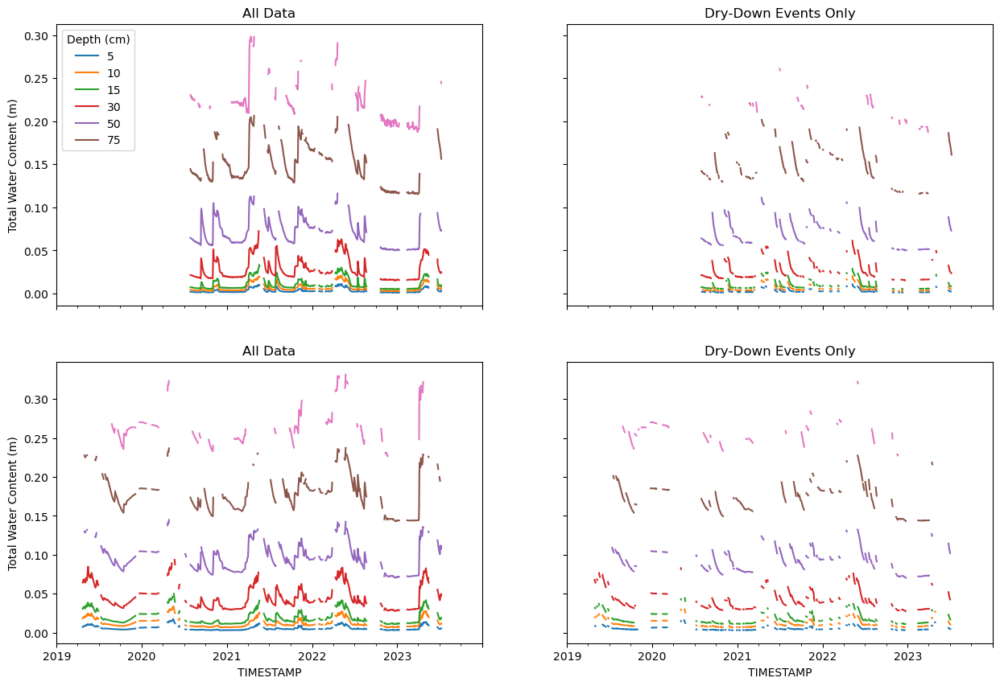

In [94]:
pits = "AC"
b_depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(len(pits), 2, figsize=(15,10), sharex="col", sharey="row")
axs = np.atleast_1d(axs)
for i, pit in enumerate(pits):
    h_nf_daily.filter(regex=f"h_{pit}").plot(ax=axs[i, 0], legend=False)
    axs[i, 0].set_ylabel("Total Water Content (m)")
    axs[i,0].set_title("All Data")
    
    h_nf_daily_filtered.filter(regex=f"h_{pit}").plot(ax=axs[i, 1], legend=False)
    axs[i, 1].set_ylabel("")
    axs[i, 1].set_title("Dry-Down Events Only")
axs[0, 0].legend(title="Depth (cm)", labels=b_depths);

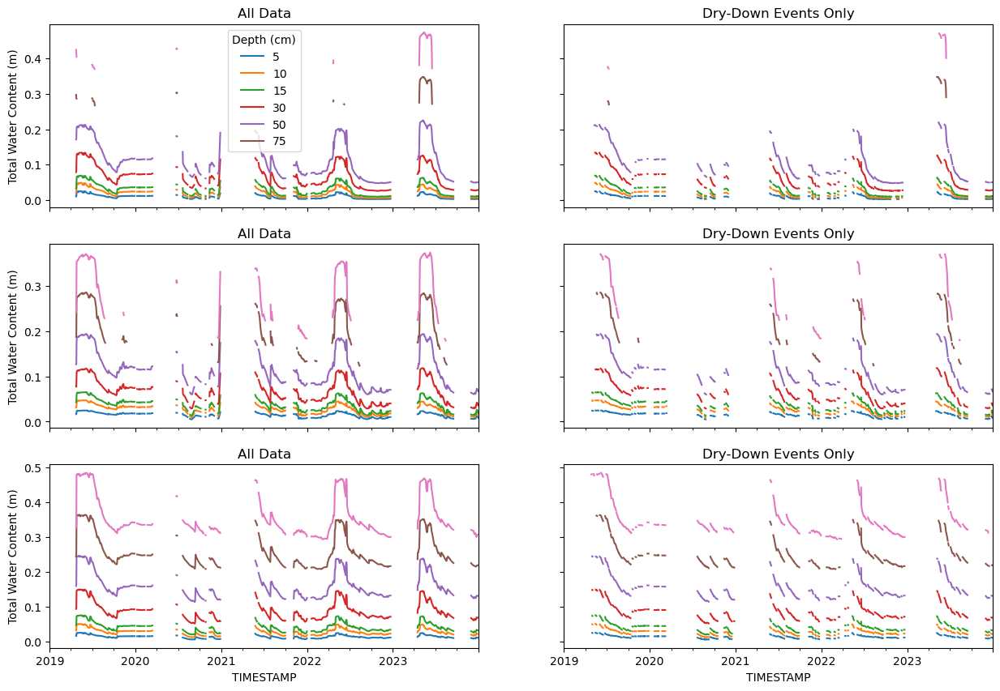

In [95]:
pits = "ABC"
b_depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(len(pits), 2, figsize=(15,10), sharex="col", sharey="row")
axs = np.atleast_1d(axs)
for i, pit in enumerate(pits):
    h_uf_daily.filter(regex=f"h_{pit}").plot(ax=axs[i, 0], legend=False)
    axs[i, 0].set_ylabel("Total Water Content (m)")
    axs[i,0].set_title("All Data")
    
    h_uf_daily_filtered.filter(regex=f"h_{pit}").plot(ax=axs[i, 1], legend=False)
    axs[i, 1].set_ylabel("")
    axs[i, 1].set_title("Dry-Down Events Only")
    
axs[0, 0].legend(title="Depth (cm)", labels=b_depths);

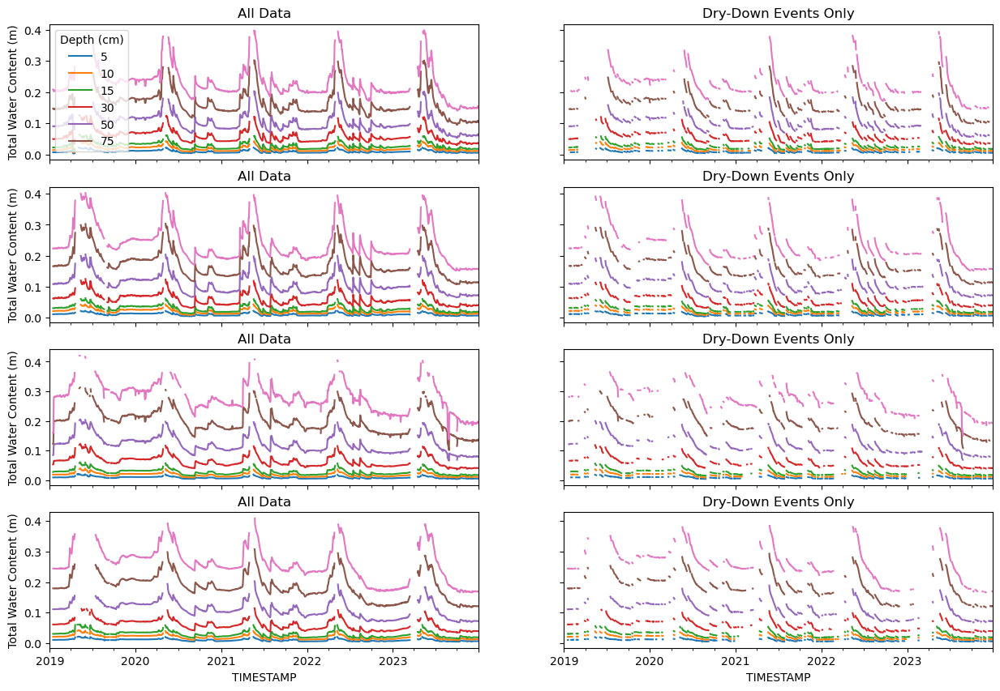

In [96]:
pits = "ABCD"
b_depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(len(pits), 2, figsize=(15,10), sharex="col", sharey="row")
axs = np.atleast_1d(axs)
for i, pit in enumerate(pits):
    h_sf_daily.filter(regex=f"h_{pit}").plot(ax=axs[i, 0], legend=False)
    axs[i, 0].set_ylabel("Total Water Content (m)")
    axs[i,0].set_title("All Data")
    
    h_sf_daily_filtered.filter(regex=f"h_{pit}").plot(ax=axs[i, 1], legend=False)
    axs[i, 1].set_ylabel("")
    axs[i, 1].set_title("Dry-Down Events Only")
axs[0, 0].legend(title="Depth (cm)", labels=b_depths);

Make some rough correlation plots

## Combine into a single dataframe

Processing notes:
* exclude all negative soil moisture gains
* exclude all "small" soil moisture fluxes. The reasoning behind this is threefold:
    * these small events could be due to soil water flow, and not due to evapotranspiration. The reasoning behind this is that we see *no* ET response for these small soil fluxes.
    * these events are part of a series of multiple small inputs in rapid succession, such as daily snowmelt inputs. In these cases, there likely isn't enough time for the ecosystem ET to repond in between events.
    * These are due to noise in the soil moisture probe readings.

In [97]:
drydown_fluxes_nf["Site"] = "NF"
drydown_fluxes_nf["Height"] = "Ecosystem"

drydown_fluxes_nf_under["Site"] = "NF"
drydown_fluxes_nf_under["Height"] = "Understory"

drydown_fluxes_nf_can["Site"] = "NF"
drydown_fluxes_nf_can["Height"] = "Canopy"

drydown_fluxes_uf["Site"] = "UF"
drydown_fluxes_uf["Height"] = "Ecosystem"

drydown_fluxes_uf_under["Site"] = "UF"
drydown_fluxes_uf_under["Height"] = "Understory"

drydown_fluxes_sf["Site"] = "SF"
drydown_fluxes_sf["Height"] = "Understory"

drydown_fluxes = pd.concat([drydown_fluxes_nf, drydown_fluxes_nf_under, drydown_fluxes_nf_can, drydown_fluxes_uf, drydown_fluxes_uf_under, drydown_fluxes_sf])

drydown_fluxes["et"] = drydown_fluxes["et"]*1000
drydown_fluxes["delta_s"] = -drydown_fluxes["delta_s"]*1000
drydown_fluxes["excess_et"] = drydown_fluxes["et"] - drydown_fluxes["delta_s"]

drydown_fluxes = drydown_fluxes.query("delta_s > 0").copy()

q = 0.3
delta_s_thresholds = (
    drydown_fluxes
    .groupby(["Site", "Height", "pit", "z"])[["delta_s"]]
    .quantile(q)
    .reset_index()
)
drydown_fluxes = (
    drydown_fluxes
    .merge(delta_s_thresholds, on=["Site", "Height", "pit", "z"], how="inner", suffixes=["", "_threshold"])
)

drydown_fluxes = drydown_fluxes.where(drydown_fluxes["delta_s"] > drydown_fluxes["delta_s_threshold"])
drydown_fluxes = drydown_fluxes.dropna()
drydown_fluxes.to_pickle("drydown_fluxes.pickle")

Compute drydown fluxes, but only using *daytime* ET

# Regressions

## Check that independent variables are not correlated

In [2]:
corr_test = drydown_fluxes.copy()
corr_test["year"] = corr_test.t_start.dt.year
corr_test["month"] = corr_test.t_start.dt.month
corr_test["pit"] = pd.factorize(corr_test["pit"])[0]
corr_test["Site"] = pd.factorize(corr_test["Site"])[0]
corr_test["Height"] = pd.factorize(corr_test["Height"])[0]

corr_test[["delta_s", "z", "pit", "Site", "Height", "year", "month"]].corr()

def make_pretty(styler):
    styler.set_caption("Correlation between Soil Moisture Losses and ET by Depth")
    styler.format(lambda v: np.round(v,2))
    styler.background_gradient(axis=None, vmin=0, vmax=0.7, cmap="Blues")
    return styler
display((corr_test[["delta_s", "z", "pit", "Site", "Height", "year", "month"]].corr()**2).style.pipe(make_pretty))

NameError: name 'drydown_fluxes' is not defined

## Understory

In [12]:
m = ols("et ~ delta_s*C(z)*C(Site)", data=drydown_fluxes.query("Height == 'Understory' and z <= 50")).fit()
m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     et   R-squared:                       0.594
Model:                            OLS   Adj. R-squared:                  0.583
Method:                 Least Squares   F-statistic:                     53.41
Date:                Tue, 21 Jan 2025   Prob (F-statistic):          1.78e-184
Time:                        13:51:13   Log-Likelihood:                -4045.4
No. Observations:                1088   AIC:                             8151.
Df Residuals:                    1058   BIC:                             8301.
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              1.7388      1.592      1.093      0.275      -1.384       4.862
C(z)[T.10.0]                          -0.0642      2.369     -0.027      0.978      -4.713       4.585
C(z)[T.15.0]                          -0.5056      2.364     -0.214      0.831      -5.144       4.133
C(z)[T.30.0]                          -0.8563      2.460     -0.348      0.728      -5.683       3.971
C(z)[T.50.0]                          -2.2192      4.459     -0.498      0.619     -10.970       6.531
C(Site)[T.SF]                          0.6277      1.974      0.318      0.751      -3.246       4.502
C(Site)[T.UF]                         -0.5564      2.554     -0.218      0.828      -5.568       4.455
C(z)[T.10.0]:C(Site)[T.SF]             0.4200      2.876      0.146      0.884      -5.222       6.062
C(z)[T.15.0]:C(Site)[T.SF]             1.9202      2.914      0.659      0.510      -3.797       7.638
C(z)[T.30.0]:C(Site)[T.SF]             2.0889      3.173      0.658      0.510      -4.138       8.315
C(z)[T.50.0]:C(Site)[T.SF]             4.0894      5.075      0.806      0.421      -5.868      14.047
C(z)[T.10.0]:C(Site)[T.UF]             0.5799      3.815      0.152      0.879      -6.906       8.066
C(z)[T.15.0]:C(Site)[T.UF]             0.9521      3.738      0.255      0.799      -6.383       8.287
C(z)[T.30.0]:C(Site)[T.UF]             0.5398      4.229      0.128      0.898      -7.758       8.838
C(z)[T.50.0]:C(Site)[T.UF]             0.9285      5.451      0.170      0.865      -9.768      11.625
delta_s                                4.7923      0.956      5.013      0.000       2.916       6.668
delta_s:C(z)[T.10.0]                  -2.1816      1.089     -2.003      0.045      -4.319      -0.045
delta_s:C(z)[T.15.0]                  -3.0007      1.016     -2.952      0.003      -4.995      -1.006
delta_s:C(z)[T.30.0]                  -3.8861      0.978     -3.973      0.000      -5.806      -1.967
delta_s:C(z)[T.50.0]                  -3.9746      0.995     -3.994      0.000      -5.928      -2.022
delta_s:C(Site)[T.SF]                  2.7417      1.049      2.613      0.009       0.683       4.801
delta_s:C(Site)[T.UF]                 -2.2411      1.189     -1.884      0.060      -4.575       0.092
delta_s:C(z)[T.10.0]:C(Site)[T.SF]    -1.2945      1.194     -1.084      0.278      -3.637       1.048
delta_s:C(z)[T.15.0]:C(Site)[T.SF]    -1.4658      1.121     -1.308      0.191      -3.665       0.734
delta_s:C(z)[T.30.0]:C(Site)[T.SF]    -1.6083      1.082     -1.487      0.137      -3.731       0.514
delta_s:C(z)[T.50.0]:C(Site)[T.SF]    -2.1478      1.106     -1.943      0.052      -4.317       0.022
delta_s:C(z)[T.10.0]:C(Site)[T.UF]     0.9462      1.361      0.695      0.487      -1.724      

We find that there is significant interaction between treatment and depth: the soil water extraction efficiency (slope of the $\Sum ET ~ \Delta S$ curve) changes with depth differently between the two treatments.

In [13]:
site_uf_terms = {}
for z in [5, 10, 15, 30, 50, 75, 100]:
    m = ols("et ~ delta_s*Site", data=drydown_fluxes.query("Height == 'Understory' and z == @z")).fit()
    site_uf_terms[z] = m.params["delta_s:Site[T.UF]"]
    # print(z)
    # display(m.summary().tables[1])

depth_terms = {}
for site in ["NF", "UF"]:
    m = ols("et ~ delta_s*z", data=drydown_fluxes.query("Height == 'Understory' and Site == @site and z <= 50")).fit()
    depth_terms[site] = m.params["delta_s:z"]

print("Effect of Treatment (UF) at each soil depth (units of mm Understory ET / mm ΔS")
for k, v in site_uf_terms.items():
    print(f"≤{k}cm: {v:.3f}")
print()

print("Effect of Depth at each treatment (units of mm Understory ET / mm ΔS / m depth")
for k, v in depth_terms.items():
    print(f"{k}: {v*100:.2f}")
# depth_terms  # units of 1/cm
# site_uf_terms

Effect of Treatment (UF) at each soil depth (units of mm Understory ET / mm ΔS
≤5cm: -2.241
≤10cm: -1.295
≤15cm: -0.783
≤30cm: 0.024
≤50cm: -0.023
≤75cm: 0.072
≤100cm: 0.217

Effect of Depth at each treatment (units of mm Understory ET / mm ΔS / m depth
NF: -2.82
UF: -0.98


## Whole ecosystem

In [14]:
m = ols("et ~ delta_s*C(z)*C(Site)", data=drydown_fluxes.query("Height == 'Ecosystem' and z <= 50")).fit()
m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     et   R-squared:                       0.501
Model:                            OLS   Adj. R-squared:                  0.478
Method:                 Least Squares   F-statistic:                     22.23
Date:                Tue, 21 Jan 2025   Prob (F-statistic):           5.11e-52
Time:                        13:51:16   Log-Likelihood:                -1918.5
No. Observations:                 441   AIC:                             3877.
Df Residuals:                     421   BIC:                             3959.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              7.7495      2.988      2.594      0.010       1.877      13.622
C(z)[T.10.0]                          -0.1060      4.477     -0.024      0.981      -8.905       8.693
C(z)[T.15.0]                          -1.4855      4.466     -0.333      0.740     -10.264       7.293
C(z)[T.30.0]                          -3.2389      4.649     -0.697      0.486     -12.378       5.900
C(z)[T.50.0]                          -7.7937      8.457     -0.922      0.357     -24.417       8.830
C(Site)[T.UF]                         -5.2613      5.116     -1.028      0.304     -15.318       4.795
C(z)[T.10.0]:C(Site)[T.UF]             0.9983      7.495      0.133      0.894     -13.735      15.731
C(z)[T.15.0]:C(Site)[T.UF]             2.7937      7.426      0.376      0.707     -11.803      17.390
C(z)[T.30.0]:C(Site)[T.UF]             0.5714      8.532      0.067      0.947     -16.199      17.342
C(z)[T.50.0]:C(Site)[T.UF]             4.0200     10.769      0.373      0.709     -17.147      25.187
delta_s                               13.8202      1.808      7.643      0.000      10.266      17.375
delta_s:C(z)[T.10.0]                  -6.1376      2.062     -2.976      0.003     -10.191      -2.084
delta_s:C(z)[T.15.0]                  -8.5510      1.923     -4.446      0.000     -12.332      -4.770
delta_s:C(z)[T.30.0]                 -11.0975      1.851     -5.996      0.000     -14.735      -7.460
delta_s:C(z)[T.50.0]                 -11.3646      1.883     -6.035      0.000     -15.066      -7.663
delta_s:C(Site)[T.UF]                 -4.3102      2.280     -1.891      0.059      -8.791       0.171
delta_s:C(z)[T.10.0]:C(Site)[T.UF]     1.2138      2.617      0.464      0.643      -3.930       6.358
delta_s:C(z)[T.15.0]:C(Site)[T.UF]     2.4664      2.446      1.008      0.314      -2.341       7.274
delta_s:C(z)[T.30.0]:C(Site)[T.UF]     4.8402      2.414      2.005      0.046       0.095       9.586
delta_s:C(z)[T.50.0]:C(Site)[T.UF]     4.3644      2.381      1.833      0.068      -0.316       9.045
==============================================================================
Omnibus:                      128.034   Durbin-Watson:                   1.633
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              293.831
Skew:                           1.492   Prob(JB):                     1.57e-64
Kurtosis:                       5.663   Cond. No.                         142.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

*There **is** a significant interaction of slopes between depth and treatment for the whole ecosystem!*

Therefore, we need to look at the affect of treatment for each depth and vice-versa

In [15]:
site_uf_terms = {}
for z in [5, 10, 15, 30, 50, 75, 100]:
    m = ols("et ~ delta_s*Site", data=drydown_fluxes.query("Height == 'Ecosystem' and z == @z")).fit()
    site_uf_terms[z] = m.params["delta_s:Site[T.UF]"]
    # print(z)
    # display(m.summary().tables[1])

depth_terms = {}
for site in ["NF", "UF"]:
    m = ols("et ~ delta_s*z", data=drydown_fluxes.query("Height == 'Ecosystem' and Site == @site and z <= 50")).fit()
    depth_terms[site] = m.params["delta_s:z"]

print("Effect of Treatment (UF) at each soil depth (units of mm Ecosystem ET / mm Δθ")
for k, v in site_uf_terms.items():
    print(f"≤{k}cm: {v:.3f}")
print()

print("Effect of Depth at each treatment (units of mm Ecosystem ET / mm Δθ / m depth")
for k, v in depth_terms.items():
    print(f"{k}: {v*100:.2f}")
# depth_terms  # units of 1/cm
# site_uf_terms

Effect of Treatment (UF) at each soil depth (units of mm Ecosystem ET / mm Δθ
≤5cm: -4.310
≤10cm: -3.096
≤15cm: -1.844
≤30cm: 0.530
≤50cm: 0.054
≤75cm: 0.362
≤100cm: 0.883

Effect of Depth at each treatment (units of mm Ecosystem ET / mm Δθ / m depth
NF: -8.25
UF: -4.25


With this significant interaction term, we notice two things when stratifying by our predictors:

* The smallest effect of treatment on the understory flux/soil moisture relationship occurs in the mid layers of soil, whereas the strongest difference occurs in the shallow (<5cm) soil depths (interpretation: I attribute this to to a more active understory in the UF treatment)
* The effect of depth is stronger in the NF treatment than at the UF treatment (interpretation: I attribute this to a stronger link at the surface in UF)

Now to put all this into a figure.

## Plots

In [16]:
from statsmxodels.sandbox.regression.predstd import wls_prediction_std

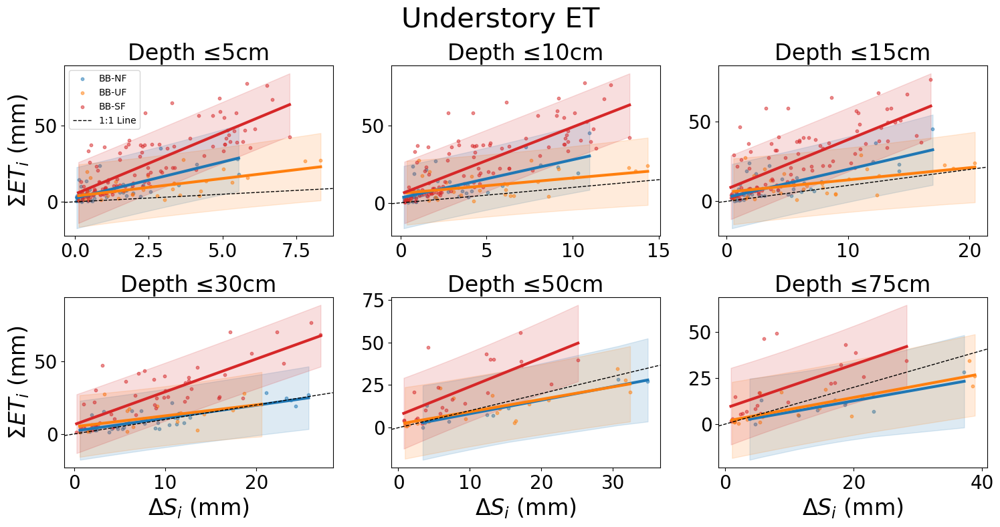

In [17]:
df = (
    drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin([4, 5, 6, 7, 8, 9])]
    .query("Height == 'Understory' and z <= 75")
    .copy()
    .dropna()
)
m = ols("et ~ delta_s*C(z)*C(Site)", data=df).fit()

df["et_pred"] = m.predict()
# envelope = wls_prediction
df[["et_stderr", "et_lci", "et_uci"]] =  np.asarray(wls_prediction_std(m)).T

depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(2, 3, figsize=(15.07, 8))
axs = axs.flatten()

colors = {"NF":"C0", "UF":"C1", "SF":"C3"}
axs[3].set_xlabel("$\Delta S_i$ (mm)", size=24)
axs[4].set_xlabel("$\Delta S_i$ (mm)", size=24)
axs[5].set_xlabel("$\Delta S_i$ (mm)", size=24)
axs[0].set_ylabel("$\Sigma ET_i$ (mm)", size=24)
axs[3].set_ylabel("$\Sigma ET_i$ (mm)", size=24)

for i, z in enumerate(depths):
    axs[i].set_title(f"Depth ≤{z}cm", size=24)
    axs[i].tick_params(axis='both', which='major', labelsize=20)
    fig.suptitle("Understory ET", size=30)
    for site in ["NF", "UF", "SF"]:
        plot_df = df.query("z == @z and Site == @site").sort_values("et_pred")
        axs[i].scatter(plot_df["delta_s"], plot_df["et"], s=10, alpha=0.5, label=f"BB-{site}", color=colors[site])
        axs[i].plot(plot_df["delta_s"], plot_df["et_pred"], lw=3, color=colors[site])
        axs[i].fill_between(plot_df["delta_s"], plot_df["et_lci"], plot_df["et_uci"], alpha=0.15, color=colors[site])
    xlim = axs[i].get_xlim()
    # axs[i].hlines(0, *xlim, 'k', '--', lw=1)
    axs[i].plot(xlim, xlim, 'k--', lw=1, label="1:1 Line")
    axs[i].set_xlim(xlim)

axs[0].legend()
plt.tight_layout(w_pad=1.4, h_pad=1.4)

plt.savefig("figs/understory_et_regression.png")

### Whole Ecosystem

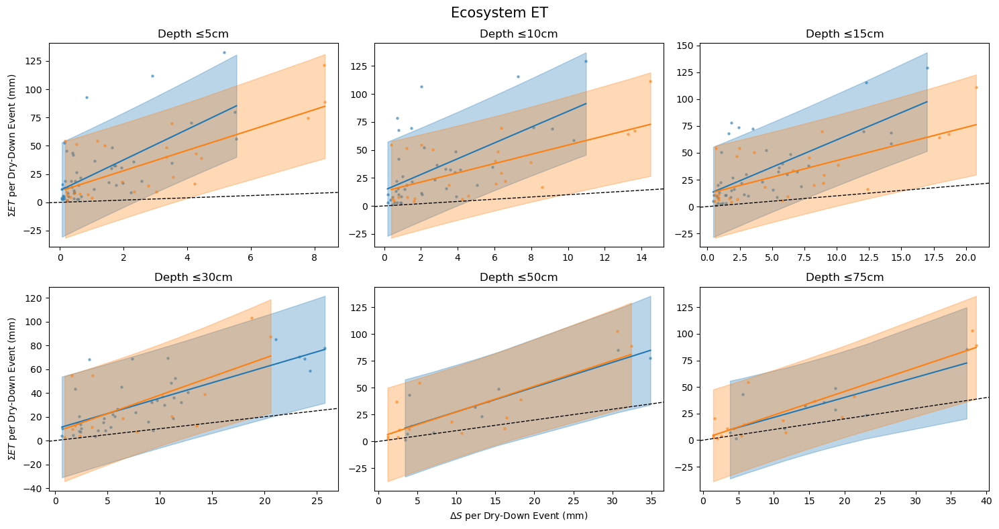

In [18]:
df = (
    drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin([4, 5, 6, 7, 8, 9])]
    .query("Height == 'Ecosystem' and z <= 75")
    .copy()
    .dropna()
)
m = ols("et ~ delta_s*C(z)*C(Site)", data=df).fit()

df["et_pred"] = m.predict()
# envelope = wls_prediction
df[["et_stderr", "et_lci", "et_uci"]] =  np.asarray(wls_prediction_std(m)).T

depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
axs = axs.flatten()

colors = {"NF":"C0", "UF":"C1"}
for i, z in enumerate(depths):
    axs[i].set_title(f"Depth ≤{z}cm")
    axs[4].set_xlabel("$\Delta S$ per Dry-Down Event (mm)")
    axs[0].set_ylabel("$\Sigma ET$ per Dry-Down Event (mm)")
    axs[3].set_ylabel("$\Sigma ET$ per Dry-Down Event (mm)")
    fig.suptitle("Ecosystem ET", size=15)
    for site in ["NF", "UF"]:
        plot_df = df.query("z == @z and Site == @site").sort_values("et_pred")
        axs[i].scatter(plot_df["delta_s"], plot_df["et"], s=5, alpha=0.5, label=site)
        axs[i].plot(plot_df["delta_s"], plot_df["et_pred"])
        axs[i].fill_between(plot_df["delta_s"], plot_df["et_lci"], plot_df["et_uci"], alpha=0.3, color=colors[site])
    xlim = axs[i].get_xlim()
    # axs[i].hlines(0, *xlim, 'k', '--', lw=1)
    axs[i].plot(xlim, xlim, 'k--', lw=1)
    axs[i].set_xlim(xlim)

plt.tight_layout(w_pad=1.1)

In [19]:
drydown_fluxes

,z,pit,et,delta_s,t_start,Site,Height,excess_et,delta_s_threshold
0,5.0,B,45.314251,0.201870,2020-07-30,NF,Ecosystem,45.112381,0.129826
1,5.0,B,32.280788,1.701042,2021-06-10,NF,Ecosystem,30.579746,0.129826
2,5.0,B,52.556211,0.139514,2021-07-11,NF,Ecosystem,52.416697,0.129826
3,5.0,B,111.673962,2.908681,2021-08-06,NF,Ecosystem,108.765281,0.129826
4,5.0,B,6.052132,0.198090,2021-12-17,NF,Ecosystem,5.854042,0.129826
...,...,...,...,...,...,...,...,...,...
3165,100.0,D,2.206439,1.276690,2022-10-07,SF,Understory,0.929749,1.147812
3166,100.0,D,4.835716,2.239121,2022-10-13,SF,Understory,2.596595,1.147812
3167,100.0,D,1.410882,1.151923,2022-11-20,SF,Understory,0.258959,1.147812
3169,100.0,D,0.401057,1.958479,2022-12-12,SF,Understory,-1.557422,1.147812


In [184]:
def compute_slopes(drydown_fluxes):
    sites = ["NF", "UF", "SF"]
    heights = ["Ecosystem", "Understory"]
    depths = [5, 10, 15, 30, 50, 75, 100]
    
    slope_dict = {
        ("Ecosystem", "NF"):[],
        ("Ecosystem", "UF"):[],
        ("Ecosystem", "SF"):[],
        ("Understory", "NF"):[],
        ("Understory", "UF"):[],
    }

    stderr_dict = {
        ("Ecosystem", "NF"):[],
        ("Ecosystem", "UF"):[],
        ("Ecosystem", "SF"):[],
        ("Understory", "NF"):[],
        ("Understory", "UF"):[],
    }
        
    for (h, s), z in itertools.product(slope_dict, depths):
        h_old = h
        if h == "Ecosystem" and s == "SF": h = "Understory"

        # avoid "pooling" in the springtime: limit SF analysis to June+
        if s == "SF": months = [7, 8, 9, 10]
        else: months = [5, 6, 7, 8, 9, 10]
            
        df = (
            drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin(months)]
            .query("Height == @h and z == @z and Site == @s")
            .copy()
            .dropna()
        )
        h = h_old
        # m = ols("et ~ delta_s", data=df).fit()
        # summary_table = m.summary().tables[1]
        # slope = float(summary_table.data[2][1])
        # stderr = float(summary_table.data[2][2])*1.96
        try:
            m = stats.linregress(df["delta_s"], df["et"])
            slope, stderr = m.slope, m.stderr
            # print(slope, stderr)
        except ValueError:
            slope, stderr = np.nan, np.nan
        if stderr <= 0: stderr = np.nan
        slope_dict[(h, s)].append(slope)
        stderr_dict[(h, s)].append(stderr)
    
    slopes = pd.DataFrame(slope_dict)
    slopes["Depth"] = depths
    slopes = slopes.set_index("Depth")

    stderrs = pd.DataFrame(stderr_dict)
    stderrs["Depth"] = depths
    stderrs = stderrs.set_index("Depth")
    return slopes, stderrs

def make_pretty(styler):
    styler.set_caption("Slope between Soil Moisture Losses and ET by Depth")
    styler.format(lambda v: np.round(v,2))
    styler.background_gradient(axis=None, cmap="RdBu_r", vmin=0.2, vmax=0.8, gmap=mpl.colors.TwoSlopeNorm(vmin=0.1, vmax=1/0.1, vcenter=1)(slopes))
    styler.set_properties(**{'text-align': 'center', 'width': '70px', "height":"20px", "font-size":"14pt"})
    return styler

slopes, stderrs = compute_slopes(drydown_fluxes)
display((slopes).style.pipe(make_pretty))
    
slopes.to_pickle("slope_table.pickle")
# df = (
#     drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin([4, 5, 6, 7, 8, 9])]
#     .query("Height == 'Ecosystem' and z <= 75")
#     .copy()
#     .dropna()
# )
# m = ols("et ~ delta_s*C(z)*C(Site)", data=df).fit()

## Residuals

,z,pit,et,delta_s,t_start,Site,Height,excess_et,delta_s_threshold
0,5.0,B,45.314251,0.201870,2020-07-30,NF,Ecosystem,45.112381,0.129826
1,5.0,B,32.280788,1.701042,2021-06-10,NF,Ecosystem,30.579746,0.129826
2,5.0,B,52.556211,0.139514,2021-07-11,NF,Ecosystem,52.416697,0.129826
3,5.0,B,111.673962,2.908681,2021-08-06,NF,Ecosystem,108.765281,0.129826
4,5.0,B,6.052132,0.198090,2021-12-17,NF,Ecosystem,5.854042,0.129826
...,...,...,...,...,...,...,...,...,...
3165,100.0,D,2.206439,1.276690,2022-10-07,SF,Understory,0.929749,1.147812
3166,100.0,D,4.835716,2.239121,2022-10-13,SF,Understory,2.596595,1.147812
3167,100.0,D,1.410882,1.151923,2022-11-20,SF,Understory,0.258959,1.147812
3169,100.0,D,0.401057,1.958479,2022-12-12,SF,Understory,-1.557422,1.147812


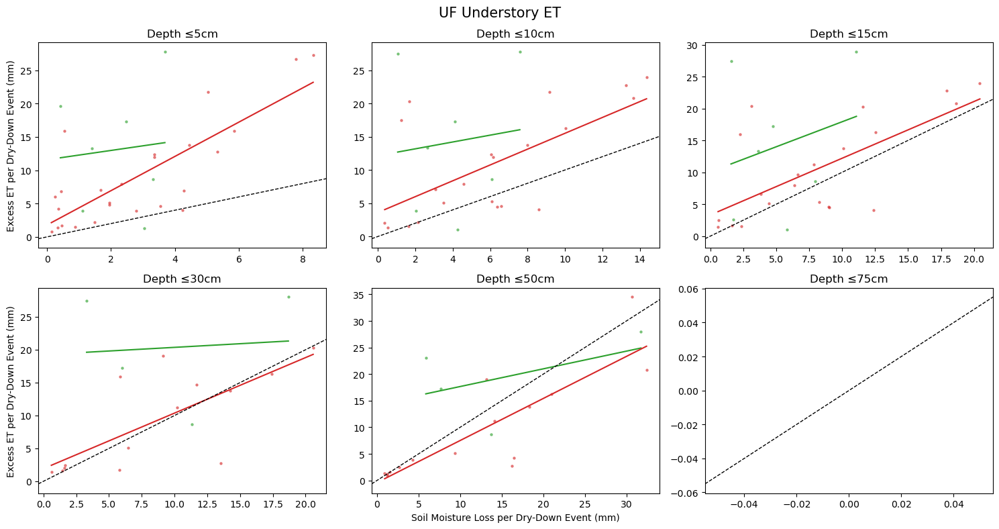

In [58]:
df = (
    drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin([4, 5, 6, 7, 8, 9])]
    .query("Height == 'Understory' and Site == 'UF' and z <= 50")
    .copy()
    .dropna()
)

year_group = []
for month in df.t_start.dt.month:
    if month in [4, 5, 6]:
        year_group.append("Spring")
    elif month in [7, 8, 9]:
        year_group.append("Summer")
    # elif month in [9]:
    #     year_group.append("Autumn")
df["year_group"] = year_group
m = ols("et ~ delta_s*C(z)*C(year_group)", data=df).fit()
# display(m.summary())
df["et_pred"] = m.predict()
# envelope = wls_prediction
df[["et_stderr", "et_lci", "et_uci"]] =  np.asarray(wls_prediction_std(m)).T

depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
axs = axs.flatten()

colors = {"Winter":"C0", "Spring":"C2", "Summer":"C3", "Autumn":"C1"}
colors = {"Spring":"C2", "Summer":"C3"}
for i, z in enumerate(depths):
    axs[i].set_title(f"Depth ≤{z}cm")
    axs[4].set_xlabel("Soil Moisture Loss per Dry-Down Event (mm)")
    axs[0].set_ylabel("Excess ET per Dry-Down Event (mm)")
    axs[3].set_ylabel("Excess ET per Dry-Down Event (mm)")
    fig.suptitle("UF Understory ET", size=15)
    for year in colors:
        plot_df = df.query("z == @z and year_group == @year").sort_values("et_pred")
        axs[i].scatter(plot_df["delta_s"], plot_df["et"], s=5, alpha=0.5, label=site, color=colors[year])
        axs[i].plot(plot_df["delta_s"], plot_df["et_pred"], color=colors[year])
        # axs[i].fill_between(plot_df["delta_s"], plot_df["et_lci"], plot_df["et_uci"], alpha=0.3, color=colors[year])
    xlim = axs[i].get_xlim()
    # axs[i].hlines(0, *xlim, 'k', '--', lw=1)
    axs[i].plot(xlim, xlim, 'k--', lw=1)
    axs[i].set_xlim(xlim)

plt.tight_layout(w_pad=1.1)

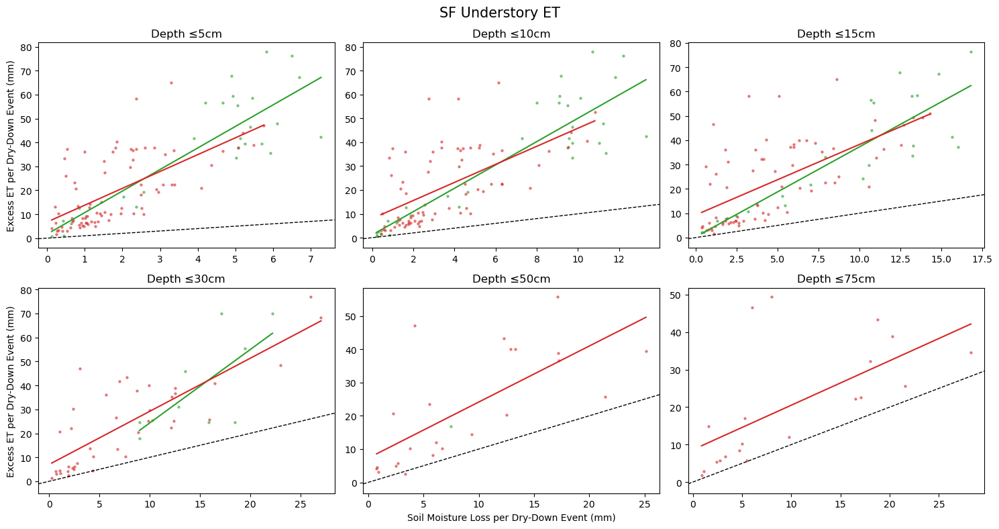

In [67]:
df = (
    drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin([4, 5, 6, 7, 8, 9])]
    .query("Height == 'Understory' and Site == 'SF' and z <= 75")
    .copy()
    .dropna()
)

year_group = []
for month in df.t_start.dt.month:
    if month in [4, 5, 6]:
        year_group.append("Spring")
    elif month in [7, 8, 9]:
        year_group.append("Summer")
    # elif month in [9]:
    #     year_group.append("Autumn")
df["year_group"] = year_group
m = ols("et ~ delta_s*C(z)*C(year_group)", data=df).fit()
# display(m.summary())
df["et_pred"] = m.predict()
# envelope = wls_prediction
df[["et_stderr", "et_lci", "et_uci"]] =  np.asarray(wls_prediction_std(m)).T

depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
axs = axs.flatten()

colors = {"Winter":"C0", "Spring":"C2", "Summer":"C3", "Autumn":"C1"}
colors = {"Spring":"C2", "Summer":"C3"}
for i, z in enumerate(depths):
    axs[i].set_title(f"Depth ≤{z}cm")
    axs[4].set_xlabel("Soil Moisture Loss per Dry-Down Event (mm)")
    axs[0].set_ylabel("Excess ET per Dry-Down Event (mm)")
    axs[3].set_ylabel("Excess ET per Dry-Down Event (mm)")
    fig.suptitle("SF Understory ET", size=15)
    for year in colors:
        plot_df = df.query("z == @z and year_group == @year").sort_values("et_pred")
        axs[i].scatter(plot_df["delta_s"], plot_df["et"], s=5, alpha=0.5, label=site, color=colors[year])
        axs[i].plot(plot_df["delta_s"], plot_df["et_pred"], color=colors[year])
        # axs[i].fill_between(plot_df["delta_s"], plot_df["et_lci"], plot_df["et_uci"], alpha=0.3, color=colors[year])
    xlim = axs[i].get_xlim()
    # axs[i].hlines(0, *xlim, 'k', '--', lw=1)
    axs[i].plot(xlim, xlim, 'k--', lw=1)
    axs[i].set_xlim(xlim)

plt.tight_layout(w_pad=1.1)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     et   R-squared:                       0.621
Model:                            OLS   Adj. R-squared:                  0.600
Method:                 Least Squares   F-statistic:                     28.42
Date:                Mon, 02 Dec 2024   Prob (F-statistic):           9.12e-67
Time:                        15:11:27   Log-Likelihood:                -1565.3
No. Observations:                 404   AIC:                             3177.
Df Residuals:                     381   BIC:                             3269.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
===================================================================================================================
                                                      coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Intercept                                           4.1594      6.639      0.626      0.531      -8.895      17.214
C(z)[T.10.0]                                       -0.9122      9.530     -0.096      0.924     -19.649      17.825
C(z)[T.15.0]                                       -0.4773      9.656     -0.049      0.961     -19.464      18.509
C(z)[T.30.0]                                       -0.8272     13.699     -0.060      0.952     -27.762      26.107
C(z)[T.50.0]                                        0.3207      2.407      0.133      0.894      -4.413       5.054
C(z)[T.75.0]                                        0.9683     24.580      0.039      0.969     -47.361      49.298
C(year_group)[T.2020-2024]                          3.1114      6.967      0.447      0.655     -10.588      16.811
C(z)[T.10.0]:C(year_group)[T.2020-2024]             1.7332      9.985      0.174      0.862     -17.899      21.366
C(z)[T.15.0]:C(year_group)[T.2020-2024]             2.8563     10.127      0.282      0.778     -17.056      22.768
C(z)[T.30.0]:C(year_group)[T.2020-2024]             0.9245     14.160      0.065      0.948     -26.917      28.766
C(z)[T.50.0]:C(year_group)[T.2020-2024]             0.1531      2.453      0.062      0.950      -4.671       4.977
C(z)[T.75.0]:C(year_group)[T.2020-2024]             2.0959     25.090      0.084      0.933     -47.237      51.429
delta_s                                             3.1537      5.311      0.594      0.553      -7.290      13.597
delta_s:C(z)[T.10.0]                               -1.1086      6.252     -0.177      0.859     -13.401      11.184
delta_s:C(z)[T.15.0]                               -1.8750      5.911     -0.317      0.751     -13.497       9.746
delta_s:C(z)[T.30.0]                               -2.1765      5.889     -0.370      0.712     -13.755       9.402
delta_s:C(z)[T.50.0]                               -2.5195      4.662     -0.540      0.589     -11.687       6.648
delta_s:C(z)[T.75.0]                               -3.0529      7.714     -0.396      0.692     -18.220      12.114
delta_s:C(year_group)[T.2020-2024]                  4.5267      5.351      0.846      0.398      -5.995      15.048
delta_s:C(z)[T.10.0]:C(year_group)[T.2020-2024]    -2.4784      6.295     -0.394      0.694     -14.856       9.899
delta_s:C(z)[T.15.0]:C(year_group)[T.2020-2024]    -2.8686      5.953     -0.482      0.630     -14.574       8.837
delta_s:C(z)[T.30.0]:C(year_group)[T.2020-2024]    -3.2887      5.930     -0.555      0.579     -14.948       8.371
delta_s:C(z)[T.50.0]:C(year_group)[T.2020-2024]    -3.4989      4.680     -0.748      0.455     -12.700       5.702
delta_s:C(z)[T.75.0]:C(year_group)[T.2020-2024]    -3.5198      7.7

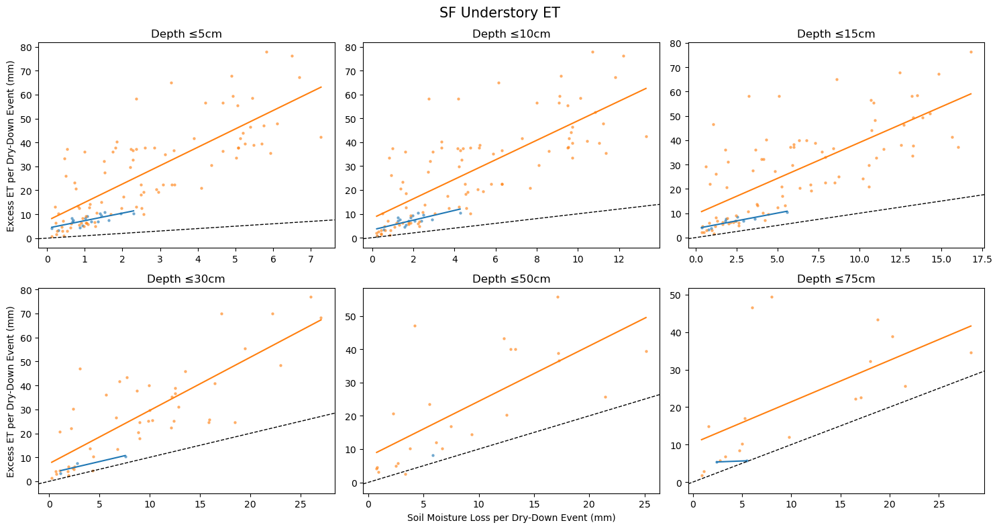

In [81]:
df = (
    drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin([4, 5, 6, 7, 8, 9])]
    .query("Height == 'Understory' and Site == 'SF' and z <= 75")
    .copy()
    .dropna()
)

year_group = []
for year in df.t_start.dt.year:
    if year in [2019]:
        year_group.append(str(year))
    # elif year in [2020]:
    #     year_group.append(str(year))
    elif year > 2019:
        year_group.append("2020-2024")

df["year_group"] = year_group
m = ols("et ~ delta_s*C(z)*C(year_group)", data=df).fit()
display(m.summary())
df["et_pred"] = m.predict()
# envelope = wls_prediction
df[["et_stderr", "et_lci", "et_uci"]] =  np.asarray(wls_prediction_std(m)).T
depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
axs = axs.flatten()

colors = {"Winter":"C0", "Spring":"C2", "Summer":"C3", "Autumn":"C1"}
colors = {"Spring":"C2", "Summer":"C3"}
colors={"2019":"C0", "2020-2024":"C1", "2021-2024":"C2"}
# colors = {y:c for y, c in zip(range(2019, 2025), ["C0", "C1", "C2", "C3", "C4", "C5"])}
for i, z in enumerate(depths):
    axs[i].set_title(f"Depth ≤{z}cm")
    axs[4].set_xlabel("Soil Moisture Loss per Dry-Down Event (mm)")
    axs[0].set_ylabel("Excess ET per Dry-Down Event (mm)")
    axs[3].set_ylabel("Excess ET per Dry-Down Event (mm)")
    fig.suptitle("SF Understory ET", size=15)
    for year in colors:
        plot_df = df.query("z == @z and year_group == @year").sort_values("et_pred")
        axs[i].scatter(plot_df["delta_s"], plot_df["et"], s=5, alpha=0.5, label=site, color=colors[year])
        axs[i].plot(plot_df["delta_s"], plot_df["et_pred"], color=colors[year])
        # axs[i].fill_between(plot_df["delta_s"], plot_df["et_lci"], plot_df["et_uci"], alpha=0.3, color=colors[year])
    xlim = axs[i].get_xlim()
    # axs[i].hlines(0, *xlim, 'k', '--', lw=1)
    axs[i].plot(xlim, xlim, 'k--', lw=1)
    axs[i].set_xlim(xlim)

plt.tight_layout(w_pad=1.1)

/tmp/ipykernel_2934433/3225882262.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=1.2, w_pad=1.2)


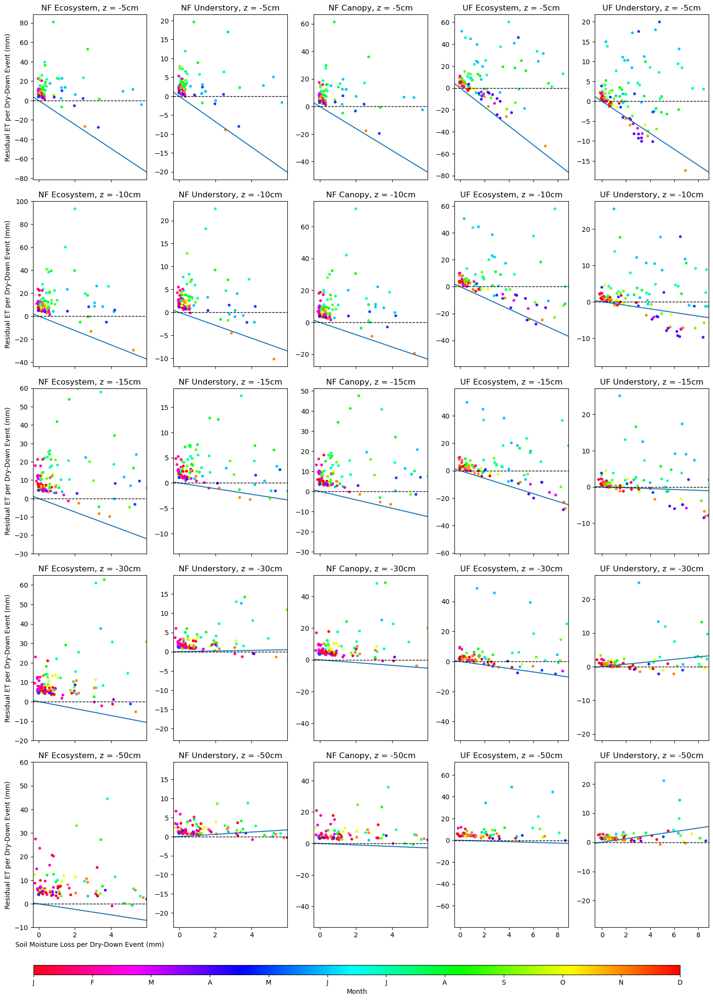

In [22]:
depths = [5, 10, 15, 30, 50]
site_dfs = [
    drydown_fluxes_nf,
    drydown_fluxes_nf_under,
    drydown_fluxes_nf_can,
    drydown_fluxes_uf,
    drydown_fluxes_uf_under,
]
sites = ["NF Ecosystem", "NF Understory", "NF Canopy", "UF Ecosystem", "UF Understory"]

def normalize_seasonal(months):
    return np.where(months <= 6, months/6, 1 - (months - 6)/6)

fig, axs = plt.subplots(5, 5, figsize=(15, 20), sharex="col")
axs = np.atleast_2d(axs)
for iz, z in enumerate(depths):
    for idf, df in enumerate(site_dfs):
        ax = axs[iz, idf]
        reg = stats.linregress(-df.query("z==@z").dropna()["delta_s"], df.query("z==@z").dropna()["et"])
        slope, intcpt = reg.slope, reg.intercept
        
        plot = ax.scatter(
            -1000*df.query("z==@z")["delta_s"], 
            1000*(df.query("z==@z")["et"]+df.query("z==@z")["delta_s"]*slope + intcpt),
            c=(df.query("z==@z").t_start.dt.month - 1)/12,
            cmap="hsv_r",
            s=10
        )
        xlim = ax.get_xlim()
        ax.plot(np.linspace(*xlim, 11), np.linspace(*xlim, 11) - (np.linspace(*xlim, 11)*slope + intcpt))
        ax.hlines(0, *xlim, 'k', '--', lw=1)
        ax.set_xlim(*xlim)
        # cbar = ax.colorbar(label="Month")
        # cbar_yticks = cbar.ax.get_yticks()
        # months = "JFMAMJJASOND"
        # cbar.ax.set_yticks(np.arange(0, 1, 1/12), months)
        ax.set_title(f"{sites[idf]}, z = -{z}cm")

axs[-1, 0].set_xlabel("Soil Moisture Loss per Dry-Down Event (mm)")
for ax in axs[:, 0]:
    ax.set_ylabel("Residual ET per Dry-Down Event (mm)")

fig.subplots_adjust(bottom=0.8)
cbar_ax = fig.add_axes([0.05, -0.02, 0.9, 0.01])
cbar = fig.colorbar(plot, cax=cbar_ax, orientation="horizontal")
cbar_ax.set_xlabel("Month")
cbar_xticks = cbar_ax.get_yticks()
months = "JFMAMJJASOND"
cbar_ax.set_xticks(np.arange(0, 1, 1/12), months)

# custom axis limits...ughhhh
axs[2, 0].set_ylim(-0.03*1000, 0.06*1000)
axs[3, 0].set_ylim(-0.02*1000, 0.065*1000)
axs[4, 0].set_ylim(-0.01*1000, 0.06*1000)

plt.tight_layout(h_pad=1.2, w_pad=1.2)

/tmp/ipykernel_2934433/2767186978.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=1.2, w_pad=1.2)


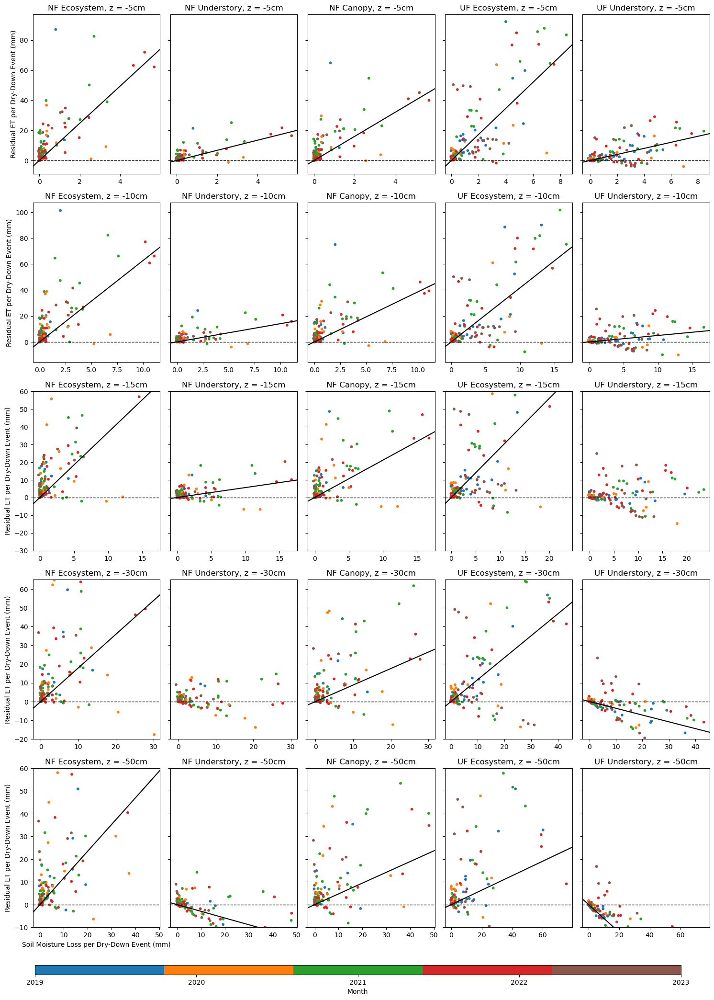

In [23]:
depths = [5, 10, 15, 30, 50]
site_dfs = [
    drydown_fluxes_nf,
    drydown_fluxes_nf_under,
    drydown_fluxes_nf_can,
    drydown_fluxes_uf,
    drydown_fluxes_uf_under,
]
sites = ["NF Ecosystem", "NF Understory", "NF Canopy", "UF Ecosystem", "UF Understory"]

def normalize_annual(years):
    return (years - 2019)/(2024-2019)

colors = ['C0', "C1", "C2", "C3", "C5"]
cmap = mpl.colors.ListedColormap(colors)

fig, axs = plt.subplots(5, 5, figsize=(15, 20), sharey="row")
axs = np.atleast_2d(axs)
for iz, z in enumerate(depths):
    for idf, df in enumerate(site_dfs):
        ax = axs[iz, idf]
        reg = stats.linregress(-df.query("z==@z").dropna()["delta_s"], df.query("z==@z").dropna()["et"] + df.query("z==@z").dropna()["delta_s"])
        slope, intcpt = reg.slope, reg.intercept
        
        plot = ax.scatter(
            -1000*df.query("z==@z")["delta_s"], 
            1000*(df.query("z==@z")["et"] + df.query("z==@z")["delta_s"]),
            c=(df.query("z==@z").t_start.dt.year - 2019)/(2023-2019),
            cmap=cmap,
            s=10
        )
        xlim = ax.get_xlim()
        if reg.pvalue < 0.05:
            ax.plot(np.linspace(*xlim, 11), (np.linspace(*xlim, 11)*slope + intcpt), color='k')
        ax.hlines(0, *xlim, 'k', '--', lw=1)
        ax.set_xlim(*xlim)
        # cbar = ax.colorbar(label="Month")
        # cbar_yticks = cbar.ax.get_yticks()
        # months = "JFMAMJJASOND"
        # cbar.ax.set_yticks(np.arange(0, 1, 1/12), months)
        ax.set_title(f"{sites[idf]}, z = -{z}cm")

axs[-1, 0].set_xlabel("Soil Moisture Loss per Dry-Down Event (mm)")
for ax in axs[:, 0]:
    ax.set_ylabel("Residual ET per Dry-Down Event (mm)")

fig.subplots_adjust(bottom=0.8)
cbar_ax = fig.add_axes([0.05, -0.02, 0.9, 0.01])
cbar = fig.colorbar(plot, cax=cbar_ax, orientation="horizontal")
cbar_ax.set_xlabel("Month")
cbar_xticks = cbar_ax.get_yticks()
months = "JFMAMJJASOND"
cbar_ax.set_xticks(np.linspace(0, 1, 5), np.arange(2019, 2024, 1))

# custom axis limits...ughhhh
axs[2, 0].set_ylim(-0.03*1000, 0.06*1000)
axs[3, 0].set_ylim(-0.02*1000, 0.065*1000)
axs[4, 0].set_ylim(-0.01*1000, 0.06*1000)

plt.tight_layout(h_pad=1.2, w_pad=1.2)

Re-plot with colored regressionlines

Observations:
* wintertime fluxes and soil moisture changes are generally very low
* Summertime (Jul - Oct) likely do not draw from shallow soil moisture in NF as much as they do in UF
* Early spring (Mar-Apr) fluxes are associated with shallow soil moisture for both whole ecosystem and understory fluxes in the UF treatment. This association is stronger than in the NF treatment
* Late spring (May-Jun) is much more variable in its association with soil moisture dynamics, but seems to prefer deep soil moisture in both cases.
* Immediately following the fire, shallow soil moisture (<=15cm) changes were tightly linked to evapotranspiration in the UF treatment understory tower. This link is *not* seen in the NF treatment.
* Several years after the fire, there is more variance in the residuals in UF understory fluxes, especially in deeper layers.

/tmp/ipykernel_2934433/2936581162.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=1.2, w_pad=1.2)


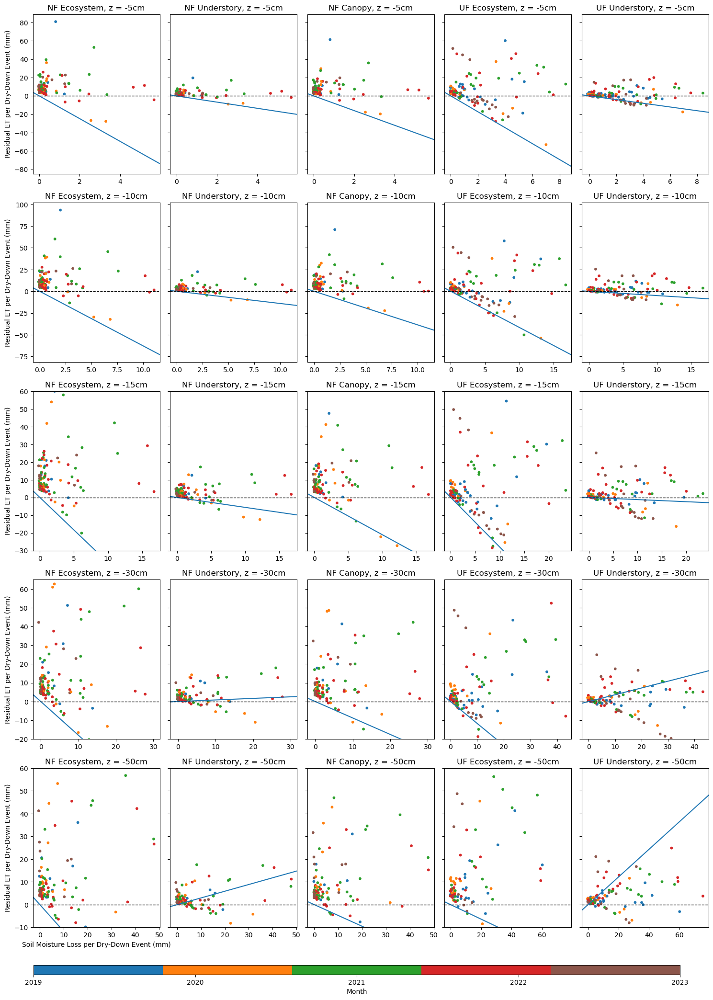

In [24]:
depths = [5, 10, 15, 30, 50]
site_dfs = [
    drydown_fluxes_nf,
    drydown_fluxes_nf_under,
    drydown_fluxes_nf_can,
    drydown_fluxes_uf,
    drydown_fluxes_uf_under,
]
sites = ["NF Ecosystem", "NF Understory", "NF Canopy", "UF Ecosystem", "UF Understory"]

def normalize_annual(years):
    return (years - 2019)/(2024-2019)

colors = ['C0', "C1", "C2", "C3", "C5"]
cmap = mpl.colors.ListedColormap(colors)

fig, axs = plt.subplots(5, 5, figsize=(15, 20), sharey="row")
axs = np.atleast_2d(axs)
for iz, z in enumerate(depths):
    for idf, df in enumerate(site_dfs):
        ax = axs[iz, idf]
        reg = stats.linregress(-df.query("z==@z").dropna()["delta_s"], df.query("z==@z").dropna()["et"])
        slope, intcpt = reg.slope, reg.intercept
        
        plot = ax.scatter(
            -1000*df.query("z==@z")["delta_s"], 
            1000*(df.query("z==@z")["et"]+df.query("z==@z")["delta_s"]*slope + intcpt),
            c=(df.query("z==@z").t_start.dt.year - 2019)/(2023-2019),
            cmap=cmap,
            s=10
        )
        xlim = ax.get_xlim()
        ax.plot(np.linspace(*xlim, 11), np.linspace(*xlim, 11) - (np.linspace(*xlim, 11)*slope + intcpt))
        ax.hlines(0, *xlim, 'k', '--', lw=1)
        ax.set_xlim(*xlim)
        # cbar = ax.colorbar(label="Month")
        # cbar_yticks = cbar.ax.get_yticks()
        # months = "JFMAMJJASOND"
        # cbar.ax.set_yticks(np.arange(0, 1, 1/12), months)
        ax.set_title(f"{sites[idf]}, z = -{z}cm")

axs[-1, 0].set_xlabel("Soil Moisture Loss per Dry-Down Event (mm)")
for ax in axs[:, 0]:
    ax.set_ylabel("Residual ET per Dry-Down Event (mm)")

fig.subplots_adjust(bottom=0.8)
cbar_ax = fig.add_axes([0.05, -0.02, 0.9, 0.01])
cbar = fig.colorbar(plot, cax=cbar_ax, orientation="horizontal")
cbar_ax.set_xlabel("Month")
cbar_xticks = cbar_ax.get_yticks()
months = "JFMAMJJASOND"
cbar_ax.set_xticks(np.linspace(0, 1, 5), np.arange(2019, 2024, 1))

# custom axis limits...ughhhh
axs[2, 0].set_ylim(-0.03*1000, 0.06*1000)
axs[3, 0].set_ylim(-0.02*1000, 0.065*1000)
axs[4, 0].set_ylim(-0.01*1000, 0.06*1000)

plt.tight_layout(h_pad=1.2, w_pad=1.2)

# Main Analysis

## Pure Uptake Depth

In [3]:
drydown_fluxes = pd.read_pickle("drydown_fluxes.pickle")

_, _, drydown_fluxes["xax"] = get_WY_and_season(drydown_fluxes.t_start)

best_depths, best_depth_stderrs, best_depths_rounded = compute_uptake_depth(drydown_fluxes)
best_depths = best_depths.loc[~best_depths.index.str.contains("Winter")]
best_depth_stderrs = best_depth_stderrs.loc[~best_depth_stderrs.index.str.contains("Winter")]
best_depths_rounded = best_depths_rounded.loc[~best_depths_rounded.index.str.contains("Winter")]

warnings.resetwarnings()

## More timeseries data processing

In [43]:
#### turbulent fluxes
daylight_hours = np.arange(10, 15)
flux_data_daylight = (
    flux_nf.loc[flux_nf.index.hour.isin(daylight_hours)]
    .merge(flux_nf_under.loc[flux_nf_under.index.hour.isin(daylight_hours)], left_index=True, right_index=True, how="outer", suffixes=["-NF_eco", "-NF_und"])
    .merge(flux_sf.loc[flux_sf.index.hour.isin(daylight_hours)], left_index=True, right_index=True, how="outer")
    .merge(flux_uf_under.loc[flux_uf_under.index.hour.isin(daylight_hours)], left_index=True, right_index=True, how="outer", suffixes=["-SF_eco", "-UF_und"])
    .merge(flux_uf.loc[flux_uf.index.hour.isin(daylight_hours)], left_index=True, right_index=True, how="outer")
    .rename(columns=dict(ET="ET-UF_eco", NEE="NEE-UF_eco", GPP="GPP-UF_eco", Reco="Reco-UF_eco", TA="TA-UF_eco", VPD="VPD-UF_eco", PotRad="PotRad-UF_eco", Rg="Rg-UF_eco", Rnet="Rnet-UF_eco", WS="WS-UF_eco"))
)
flux_data_daylight[["WUE-NF_eco", "WUE-NF_und", "WUE-SF_eco", "WUE-UF_und", "WUE-UF_eco"]] = flux_data_daylight.filter(regex="^GPP").values / (flux_data_daylight.filter(regex="^ET").values) * 0.997  # gC/kgH2O
for c in ["NF_eco", "NF_und", "SF_eco", "UF_und", "UF_eco"]:
    flux_data_daylight[f"WUE-{c}"] = flux_data_daylight[f"WUE-{c}"].where((flux_data_daylight[f"ET-{c}"] > 0.5/1000))# & (WUE_data[f"GPP-{c}"] >= 0))

flux_data_allday = (
    flux_nf
    .merge(flux_nf_under, left_index=True, right_index=True, how="outer", suffixes=["-NF_eco", "-NF_und"])
    .merge(flux_sf, left_index=True, right_index=True, how="outer")
    .merge(flux_uf_under, left_index=True, right_index=True, how="outer", suffixes=["-SF_eco", "-UF_und"])
    .merge(flux_uf, left_index=True, right_index=True, how="outer")
    .rename(columns=dict(ET="ET-UF_eco", NEE="NEE-UF_eco", GPP="GPP-UF_eco", Reco="Reco-UF_eco", TA="TA-UF_eco", VPD="VPD-UF_eco", PotRad="PotRad-UF_eco", Rg="Rg-UF_eco", Rnet="Rnet-UF_eco", WS="WS-UF_eco"))
)

flux_data_allday[["WUE-NF_eco", "WUE-NF_und", "WUE-SF_eco", "WUE-UF_und", "WUE-UF_eco"]] = flux_data_allday.filter(regex="^GPP").values / (flux_data_allday.filter(regex="^ET").values) * 0.997  # gC/kgH2O
for c in ["NF_eco", "NF_und", "SF_eco", "UF_und", "UF_eco"]:
    flux_data_allday[f"WUE-{c}"] = flux_data_allday[f"WUE-{c}"].where((flux_data_allday[f"ET-{c}"] > 0.5/1000))# & (WUE_data[f"GPP-{c}"] >= 0))

# we want to compute the mean flux values, but we don't want to include days without enough data. 
# simultaneously, we also want to be able to compute the mean down to a certain threshold. 
# sum(min_count=n)/n could work, but that limits us to the entire time period -- we can't accept any missing values.
# the custom mean_mincount function will compute the mean, unless the number of values is below a threshold.
mean_mincount = lambda x, min_count: x.mean().where(x.count() >= min_count)
flux_data_allday_daily = flux_data_allday.groupby(pd.Grouper(freq="1d")).apply(mean_mincount, 30)
flux_data_daylight_daily = flux_data_daylight.groupby(pd.Grouper(freq="1d")).apply(mean_mincount, 5)
flux_data = flux_data_allday_daily.merge(flux_data_daylight_daily, left_index=True, right_index=True, how="inner", suffixes=(",allday", ",daytime"))

del(flux_data_allday, flux_data_allday_daily, flux_data_daylight_daily)
print("Done loading flux data")

#### compute the "effective soil moisture"
sf_depths = fill_best_depths(best_depths_rounded, sf_data, "SF_eco")
nf_depths = fill_best_depths(best_depths_rounded, nf_data, "NF_eco")
nf_under_depths = fill_best_depths(best_depths_rounded, nf_under_data, "NF_und")
uf_under_depths = fill_best_depths(best_depths_rounded, uf_under_data, "UF_und")

sf_useful_s = compute_usable_s(sf_data, sf_depths, "ABCD")#.rename(columns={c:f"{c}-SF_eco" for c in sf_useful_s})
nf_useful_s = compute_usable_s(nf_data, nf_depths, "AC")#.rename(columns={c:f"{c}-NF_eco" for c in nf_useful_s})
nf_under_useful_s = compute_usable_s(nf_under_data, nf_under_depths, "AC")#.rename(columns={c:f"{c}-NF_und" for c in nf_under_useful_s})
uf_under_useful_s = compute_usable_s(uf_under_data, uf_under_depths, "ABC")#.rename(columns={c:f"{c}-UF_und" for c in uf_under_useful_s})

useful_s = (
    sf_useful_s[["Seff", "VWCeff"]]
    .merge(nf_useful_s[["Seff", "VWCeff"]], left_index=True, right_index=True, suffixes=("-SF_eco", "-NF_eco"), how="outer")
    .merge(nf_under_useful_s[["Seff", "VWCeff"]], left_index=True, right_index=True, how="outer")
    .merge(uf_under_useful_s[["Seff", "VWCeff"]], left_index=True, right_index=True, suffixes=("-NF_und", "-UF_und"), how="outer")
)
useful_s = useful_s.groupby(pd.Grouper(freq="1d")).mean()
del(sf_depths, nf_depths, nf_under_depths, uf_under_depths, sf_useful_s, nf_useful_s, nf_under_useful_s, uf_under_useful_s)

#### get VWC at each depth
vwc_sf_2 = vwc_sf.copy()
for z in [5, 10, 15, 30, 50, 75, 100]:
    vwc_sf_2[f"VWC.{z}"] = vwc_sf_2.filter(regex=f"VWC_[ABC]-{z}").mean(1)
vwc_sf_2 = vwc_sf_2.filter(regex="VWC\\.[0-9]+")
vwc_sf_2

vwc_nf_2 = vwc_nf.copy()
for z in [5, 10, 15, 30, 50, 75, 100]:
    vwc_nf_2[f"VWC.{z}"] = vwc_nf_2.filter(regex=f"VWC_[ABC]-{z}").mean(1)
vwc_nf_2 = vwc_nf_2.filter(regex="VWC\\.[0-9]+")
vwc_sf_2

vwc_nf_under_2 = vwc_nf_under.copy()
for z in [5, 10, 15, 30, 50, 75, 100]:
    vwc_nf_under_2[f"VWC.{z}"] = vwc_nf_under_2.filter(regex=f"VWC_[ABC]-{z}").mean(1)
vwc_nf_under_2 = vwc_nf_under_2.filter(regex="VWC\\.[0-9]+")

vwc_uf_under_2 = vwc_uf_under.copy()
for z in [5, 10, 15, 30, 50, 75, 100]:
    vwc_uf_under_2[f"VWC.{z}"] = vwc_uf_under_2.filter(regex=f"VWC_[ABC]-{z}").mean(1)
vwc_uf_under_2 = vwc_uf_under_2.filter(regex="VWC\\.[0-9]+")

vwc = (
    vwc_sf_2
    .merge(vwc_nf_2, left_index=True, right_index=True, suffixes=("-SF_eco", "-NF_eco"), how="outer")
    .merge(vwc_nf_under_2, left_index=True, right_index=True, how="outer")
    .merge(vwc_uf_under_2, left_index=True, right_index=True, suffixes=("-NF_und", "-UF_und"), how="outer")
)
vwc = vwc.groupby(pd.Grouper(freq="1d")).mean()
del(vwc_sf_2,vwc_nf_2,vwc_nf_under_2, vwc_uf_under_2)
print("Done loading soil data")

#### daymet precip
precip = pd.read_csv("../snotel_P.csv", parse_dates=["TIMESTAMP"])
precip["P"] = precip["P"]/1000  # keep in units of m/day
precip = precip.set_index("TIMESTAMP")

flux_data = (
    flux_data
    .merge(useful_s, left_index=True, right_index=True, how="outer")
    .merge(vwc, left_index=True, right_index=True, how="outer")
    .merge(precip, left_index=True, right_index=True, how="outer")
)
del(useful_s, vwc, precip)

#### compute PET
flux_data["zm-NF_eco"] = 18
flux_data["zm-NF_und"] = 3
flux_data["zm-SF_eco"] = 4
flux_data["zm-UF_eco"] = 18
flux_data["zm-UF_und"] = 3

flux_data["zc-NF_eco"] = 16
flux_data["zc-NF_und"] = 0.1
flux_data["zc-SF_eco"] = 0.5
flux_data["zc-UF_eco"] = 16
flux_data["zc-UF_und"] = 0.1
flux_data["zc-NF_eco"] = 16

flux_data["LAI-NF_eco"] = 2.5  # Kashian et al, 2005 + tree survey
flux_data["LAI-NF_und"] = 0.3  # Estimated from ground cover survey
flux_data["LAI-SF_eco"] = 3  # Turner et al, 2004 + seedsap survey
flux_data.loc["2020":, "LAI_SF_eco"] = 3.5*0.8

flux_data["LAI-UF_eco"] = 2.0  # Kashian et al, 2005 + tree survey
flux_data["LAI-UF_und"] = 0.8  # Estimated from ground cover survey

# generate gap-filled windspeed to compute PET
monthly_mean_ws = (
    flux_data[[]]
    .merge(
        flux_data
            .filter(regex="^WS")
            .groupby(flux_data.index.month)
            .mean()
            .reset_index(),
        left_on=flux_data.index.month, right_on="TIMESTAMP",
        how="left"
    ).set_index(flux_data.index)
    .drop(columns="TIMESTAMP")
)
# generate gap-filled windspeed to compute PET
monthly_std_ws = (
    flux_data[[]]
    .merge(
        flux_data
            .filter(regex="^WS")
            .groupby(flux_data.index.month)
            .std()
            .reset_index(),
        left_on=flux_data.index.month, right_on="TIMESTAMP",
        how="left"
    ).set_index(flux_data.index)
    .drop(columns="TIMESTAMP")
)
monthly_sample_ws = pd.DataFrame(data=stats.norm(monthly_mean_ws, monthly_std_ws/np.sqrt(30)).rvs(), columns=monthly_mean_ws.columns).set_index(monthly_mean_ws.index)
monthly_sample_ws = flux_data.loc[:, flux_data.filter(regex="^WS").columns].fillna(monthly_sample_ws)



for site in ["NF_und", "NF_eco", "UF_und", "UF_eco", "SF_eco"]:
    # flux_data[f"PET-{site},allday"] = penman_monteith(
    #     T_c=flux_data[f"TA-{site},allday"],
    #     Rn_W=flux_data[f"Rnet-{site},allday"],
    #     G_W=0,
    #     vpd_kPa=flux_data[f"VPD-{site},allday"]*0.1,
    #     LAI=flux_data[f"LAI-{site}"],
    #     u=monthly_sample_ws[f"WS-{site},allday"],
    #     zm=flux_data[f"zm-{site}"],
    #     zc=flux_data[f"zc-{site}"],
    #     Pa_kPa=77
    # )*86400/1000  # m/d
    # flux_data[f"PET-{site},daytime"] = penman_monteith(
    #     T_c=flux_data[f"TA-{site},daytime"],
    #     Rn_W=flux_data[f"Rnet-{site},daytime"],
    #     G_W=0,
    #     vpd_kPa=flux_data[f"VPD-{site},daytime"]*0.1,
    #     LAI=flux_data[f"LAI-{site}"],
    #     u=monthly_sample_ws[f"WS-{site},daytime"],
    #     zm=flux_data[f"zm-{site}"],
    #     zc=flux_data[f"zc-{site}"],
    #     Pa_kPa=77
    # )*86400/1000  # m/d
    flux_data[f"PET-{site},allday"] = penman_monteith_meas_ustar(
        T_c=flux_data[f"TA-{site},allday"],
        Rn_W=flux_data[f"Rnet-{site},allday"],
        G_W=0,
        vpd_kPa=flux_data[f"VPD-{site},allday"]*0.1,
        LAI=flux_data[f"LAI-{site}"],
        u=monthly_sample_ws[f"WS-{site},allday"],
        u=monthly_sample_ws[f"Ustar-{site},allday"],
        Pa_kPa=77
    )*86400/1000  # m/d
    flux_data[f"PET-{site},daytime"] = penman_monteith_meas_ustar(
        T_c=flux_data[f"TA-{site},daytime"],
        Rn_W=flux_data[f"Rnet-{site},daytime"],
        G_W=0,
        vpd_kPa=flux_data[f"VPD-{site},daytime"]*0.1,
        LAI=flux_data[f"LAI-{site}"],
        u=monthly_sample_ws[f"WS-{site},daytime"],
        u=monthly_sample_ws[f"Ustar-{site},daytime"],
        Pa_kPa=77
    )*86400/1000  # m/d
print("Done with PET calculation")

#### annual cumulative values
# we want to compute a cumulative sum, but we need to first make sure that we have a gapless dataset.
# at this points, gaps in the data are minimal, and we can just fill any gaps with monthly mean values.
flux_data["WY"], flux_data["Season"], flux_data["WY_Season"] = get_WY_and_season(flux_data.index)

monthly_means = (
    flux_data[[]]
    .merge(
        flux_data
            .filter(regex="^ET|^GPP|^NEE|^P$|^PET")
            .groupby(flux_data.index.month)
            .mean()
            .reset_index(),
        left_on=flux_data.index.month, right_on="TIMESTAMP",
        how="left"
    ).set_index(flux_data.index)
    .drop(columns="TIMESTAMP")
)
filled_for_cumsum = flux_data.filter(regex="^ET|^GPP|^NEE|^P$|^PET").fillna(monthly_means)
del(monthly_means)

filled_for_cumsum["WY"], _, _ = get_WY_and_season(filled_for_cumsum.index)

def cummean(x):
    # display(x.cumsum()/(~x.isna()).cumsum())
    # display(x.cumsum())
    return x.cumsum()/(~x.isna()).cumsum()

flux_data.filter(regex="WUE|^WY$").groupby("WY").apply(cummean, include_groups=False).reset_index().set_index("TIMESTAMP")
flux_data = flux_data.merge(
    filled_for_cumsum.groupby("WY").cumsum(),
    left_index=True, right_index=True, how="inner", suffixes=(".daily", ".anncum")
)

# scale the "daylight" values appropriately
for c in flux_data.filter(regex="(^ET|^Reco|^GPP|^NEE|^ET|^PET)-.+,daytime"):
    flux_data[c] = flux_data[c]*len(daylight_hours)*2/48
flux_data.head()

print("Done with cumulative calculation")

Done loading flux data
Done loading soil data
Done with PET calculation
Done with cumulative calculation


In [44]:
df = pd.wide_to_long(
    flux_data.reset_index(), 
    stubnames=set([c.split(".")[0] for c in flux_data.filter(regex="daily|anncum$")]), 
    i="TIMESTAMP", 
    j="stat", 
    sep=".",suffix="\\D+"
)

df = pd.wide_to_long(
    df.reset_index(), 
    stubnames=set([c.split(",")[0] for c in df.filter(regex="allday|daytime")]), 
    i=["TIMESTAMP", "stat"], 
    j="time_of_day", 
    sep=",", suffix="\\D+"
)

df = pd.wide_to_long(
    df.reset_index(), 
    stubnames=set([c.split("-")[0] for c in df.filter(regex="-[A-Za-z_]+")]), 
    i=["TIMESTAMP", "stat", "time_of_day"], 
    j="site", 
    sep="-", suffix="\\D+"
)

flux_long = df.reset_index()

flux_long

,TIMESTAMP,stat,time_of_day,site,LAI_SF_eco,P,Season,WY,WY_Season,VWC.5,...,NEE,zc,TA,Reco,VWCeff,VWC.75,VWC.50,Rnet,VWC.15,GPP
0,2018-04-25,daily,allday,NF_eco,NaN,0.000000,Spring,2018,Spring 2018,NaN,...,NaN,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2018-04-25,daily,allday,NF_und,NaN,0.000000,Spring,2018,Spring 2018,NaN,...,NaN,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2018-04-25,daily,allday,SF_eco,NaN,0.000000,Spring,2018,Spring 2018,NaN,...,NaN,0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2018-04-25,daily,allday,UF_und,NaN,0.000000,Spring,2018,Spring 2018,NaN,...,NaN,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2018-04-25,daily,allday,UF_eco,NaN,0.000000,Spring,2018,Spring 2018,NaN,...,NaN,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49875,2025-02-20,anncum,daytime,NF_eco,2.8,0.446005,Winter,2025,Winter 2025,NaN,...,NaN,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49876,2025-02-20,anncum,daytime,NF_und,2.8,0.446005,Winter,2025,Winter 2025,NaN,...,0.013430,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.003013
49877,2025-02-20,anncum,daytime,SF_eco,2.8,0.446005,Winter,2025,Winter 2025,NaN,...,-0.027094,0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.099692
49878,2025-02-20,anncum,daytime,UF_und,2.8,0.446005,Winter,2025,Winter 2025,NaN,...,0.008489,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.005078


In [45]:
flux_data.to_csv("all_data.csv")
flux_long.to_csv("all_data_long.csv", index=False)

## Read in Saved Timeseries Data

In [4]:
flux_data = pd.read_csv("all_data.csv", parse_dates=["TIMESTAMP"]).set_index("TIMESTAMP")
flux_long = pd.read_csv("all_data_long.csv", parse_dates=["TIMESTAMP"])

## Timeseries Plot

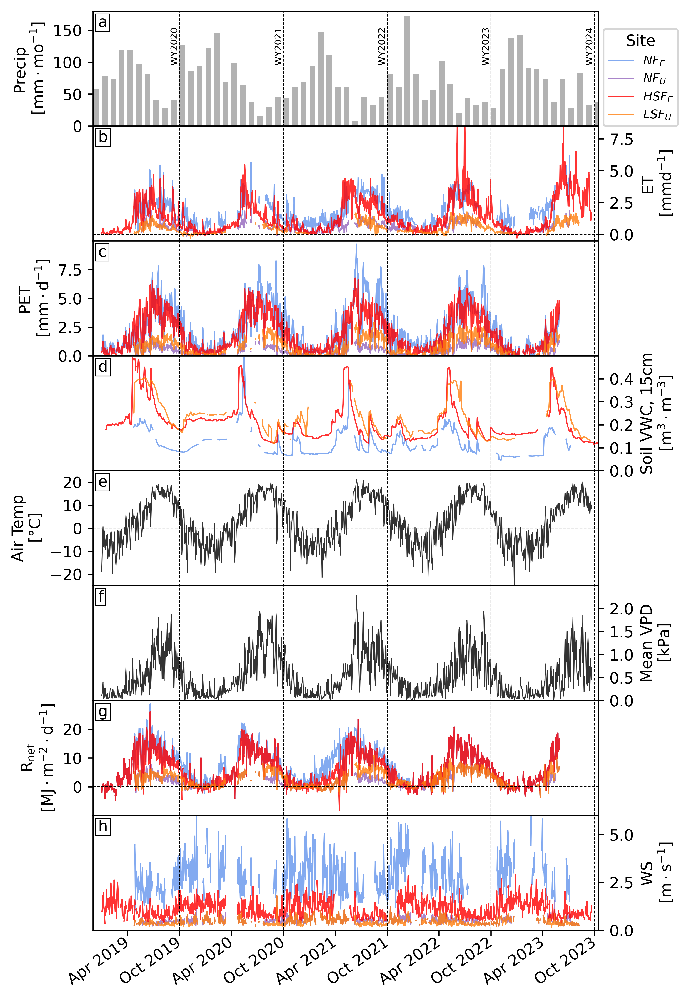

In [47]:
#### Create subplots and axes
fig, axs = plt.subplots(8, 1, figsize=(6.5, 9), dpi=600)#, height_ratios=[1, 1, 1, 1, 1, 1, 2, 2])
p_ax, et_ax, pet_ax, s_ax, ta_ax, vpd_ax, rn_ax, ws_ax = axs

#### Plot design elements and rules
site_renaming_dict = {
    "NF_eco": r"$NF_E$",
    "NF_und": r"$NF_U$",
    "SF_eco": r"$HSF_E$",
    "UF_und": r"$LSF_U$",
}
site_color_dict = {
    "NF_eco": "cornflowerblue",
    "NF_und": "C4",
    "SF_eco": "red",
    "UF_und": "C1",
}
main_lw = 0.8
main_alpha = 0.8
grid_lw = 0.5

xticks = pd.date_range("2018-10-01", "2023-10-02", freq="6MS")
xticklabels = xticks.strftime("%b %Y")
xticklabels_short = [t.replace(" ", "\n") if i%2 == 0 else '' for i, t in enumerate(xticklabels)]
xlim = pd.to_datetime(["2018-12-01", "2023-10-15"])

water_year_lines = pd.date_range("2019-01-01", "2024-01-01", freq="1YE") - pd.Timedelta("91d")
water_year_labels = [f"WY{tick.year + 1}" for tick in water_year_lines]

p_ax.set_ylabel("Precip\n" + r"[$\mathrm{mm \cdot mo^{-1}}$]")
et_ax.set_ylabel("ET\n" + r"[$\mathrm{mm d^{-1}}$]")
et_ax.yaxis.set_label_position("right")
et_ax.yaxis.tick_right()
pet_ax.set_ylabel("PET\n" + r"[$\mathrm{mm \cdot d^{-1}}$]")
s_ax.set_ylabel("Soil VWC, 15cm\n" + r"[$\mathrm{m^3 \cdot m^{-3}}$]")
s_ax.yaxis.tick_right()
s_ax.yaxis.set_label_position("right")
ta_ax.set_ylabel("Air Temp\n" + r"[$\mathrm{°C}$]")
vpd_ax.set_ylabel("Mean VPD\n" + r"[$\mathrm{kPa}$]")
vpd_ax.yaxis.tick_right()
vpd_ax.yaxis.set_label_position("right")
rn_ax.set_ylabel(r"$\mathrm{R_{net}}$"+"\n" + r"[$\mathrm{MJ \cdot m^{-2} \cdot d^{-1}}$]")
ws_ax.set_ylabel("WS\n" + r"[$\mathrm{m \cdot s^{-1}}$]")
ws_ax.yaxis.set_label_position("right")
ws_ax.yaxis.tick_right()

for ax in axs:
    ax.set_xticks(xticks, xticklabels, rotation=35, verticalalignment="center", horizontalalignment="right", rotation_mode="anchor")
    ax.set_xlim(xlim)
for ax in axs[:-1]:
    ax.tick_params('x', labelbottom=False)

fig.subplots_adjust(hspace=0, left=0.15, right=0.85, top=0.99, bottom=0.07)

for x, lab in zip(water_year_lines, water_year_labels):
    p_ax.text(x - pd.Timedelta("1d"), 95, lab, rotation=90, fontsize=6, verticalalignment="bottom", rotation_mode="anchor")

#### Plots
## P
df = (
    flux_long.query("stat == 'daily' and time_of_day == 'allday' and site == 'SF_eco'")
    .groupby(pd.Grouper(key="TIMESTAMP", freq="MS"))
    [["P"]].sum()
    .reset_index()
)
p_ax.bar(
    df["TIMESTAMP"], df["P"]*1000, 
    color='k', width=20, align="edge", alpha=0.3
)
p_ax.vlines(water_year_lines, -1000, 1000, 'k', '--', lw=grid_lw)
p_ax.set_ylim(0, 180)
p_ax.set_yticks(np.arange(0, 151, 50))

## ET
for site, df in flux_long.query("stat == 'daily' and time_of_day == 'allday' and site != 'UF_eco'").groupby("site"):
    et_ax.plot(
        df["TIMESTAMP"], df["ET"]*1000, color=site_color_dict[site],
        lw=main_lw, alpha=main_alpha
    )
et_ax.hlines(0, *et_ax.get_xlim(), 'k', '--', lw=grid_lw)
et_ax.vlines(water_year_lines, -0.5, 15, 'k', '--', lw=grid_lw)

et_ax.set_ylim(-0.5, 8.5)
et_ax.set_yticks([0, 2.5, 5, 7.5])

## PET
for site, df in flux_long.query("stat == 'daily' and time_of_day == 'allday' and site != 'UF_eco'").groupby("site"):
    pet_ax.plot(
        df["TIMESTAMP"], df["PET"]*1000, color=site_color_dict[site], 
        lw=main_lw, label=site_renaming_dict[site], alpha=main_alpha
    )
pet_ax.hlines(0, *pet_ax.get_xlim(), 'k', '--', lw=grid_lw)
pet_ax.vlines(water_year_lines, -1000, 1000, 'k', '--', lw=grid_lw)
pet_ax.set_ylim(0, 10)
pet_ax.set_yticks([0, 2.5, 5, 7.5])

## VWC
for site, df in flux_long.query("stat == 'daily' and time_of_day == 'allday' and site != 'UF_eco' and site != 'NF_und'").groupby("site"):
    s_ax.plot(
        df["TIMESTAMP"], df["VWC.15"], color=site_color_dict[site], 
        lw=main_lw, alpha=main_alpha
    )
s_ax.hlines(0, *s_ax.get_xlim(), 'k', '--', lw=grid_lw)
s_ax.vlines(water_year_lines, -1000, 1000, 'k', '--', lw=grid_lw)
s_ax.set_ylim(0, 0.5)
s_ax.set_yticks([0, 0.1, 0.2, 0.3, 0.4])

## TA
df = flux_long.query("stat == 'daily' and time_of_day == 'allday' and site == 'SF_eco'")
ta_ax.plot(df["TIMESTAMP"], df["TA"], color='k', lw=main_lw*0.7, alpha=main_alpha)
ta_ax.hlines(0, *ta_ax.get_xlim(), 'k', '--', lw=grid_lw)
ta_ax.vlines(water_year_lines, -1000, 1000, 'k', '--', lw=grid_lw)
ta_ax.set_ylim(-25, 25)
ta_ax.set_yticks(np.arange(-20, 21, 10))

## VPD
df = flux_long.query("stat == 'daily' and time_of_day == 'allday' and site == 'SF_eco'")
vpd_ax.plot(df["TIMESTAMP"], df["VPD"]/10, color='k', lw=main_lw*0.7, alpha=main_alpha)
vpd_ax.hlines(0, *vpd_ax.get_xlim(), 'k', '--', lw=grid_lw)
vpd_ax.vlines(water_year_lines, -1000, 1000, 'k', '--', lw=grid_lw)
vpd_ax.set_yticks([0, 0.5, 1, 1.5, 2])
vpd_ax.set_ylim(0, 2.5)

## RNet
for site, df in flux_long.query("stat == 'daily' and time_of_day == 'allday' and site != 'UF_eco'").groupby("site"):
    rn_ax.plot(
        df["TIMESTAMP"], df["Rnet"]*86400/1e6, color=site_color_dict[site], 
        lw=main_lw, alpha=main_alpha
    )
rn_ax.hlines(0, *rn_ax.get_xlim(), 'k', '--', lw=grid_lw)
rn_ax.vlines(water_year_lines, -1000, 1000, 'k', '--', lw=grid_lw)
rn_ax.set_ylim(-10, 30)
rn_ax.set_yticks([0, 10, 20])

## WS
for site, df in flux_long.query("stat == 'daily' and time_of_day == 'allday' and site != 'UF_eco'").groupby("site"):
    ws_ax.plot(
        df["TIMESTAMP"], df["WS"], color=site_color_dict[site], 
        lw=main_lw, alpha=main_alpha
    )
ws_ax.hlines(0, *ws_ax.get_xlim(), 'k', '--', lw=grid_lw)
ws_ax.vlines(water_year_lines, -1000, 1000, 'k', '--', lw=grid_lw)
ws_ax.set_ylim(0, 6)
ws_ax.set_yticks([0, 2.5, 5])

#### Final design elements
pet_ax.legend(loc=[1.01, 2], fontsize=8, title="Site")

label_subplot(p_ax, "a", left_pad=0.01, top_pad=0.035)
label_subplot(et_ax, "b", left_pad=0.01, top_pad=0.035)
label_subplot(pet_ax, "c", left_pad=0.01, top_pad=0.035)
label_subplot(s_ax, "d", left_pad=0.01, top_pad=0.035)
label_subplot(ta_ax, "e", left_pad=0.01, top_pad=0.035)
label_subplot(vpd_ax, "f", left_pad=0.01, top_pad=0.035)
label_subplot(rn_ax, "g", left_pad=0.01, top_pad=0.035)
label_subplot(ws_ax, "h", left_pad=0.01, top_pad=0.035)

fig.savefig("figs/timeseries.png")
pass;

## Budyko Plot

2020-10-01 2020-09-30
2020-10-01 2020-03-31
2020-04-01 2020-06-30
2020-07-01 2020-09-30


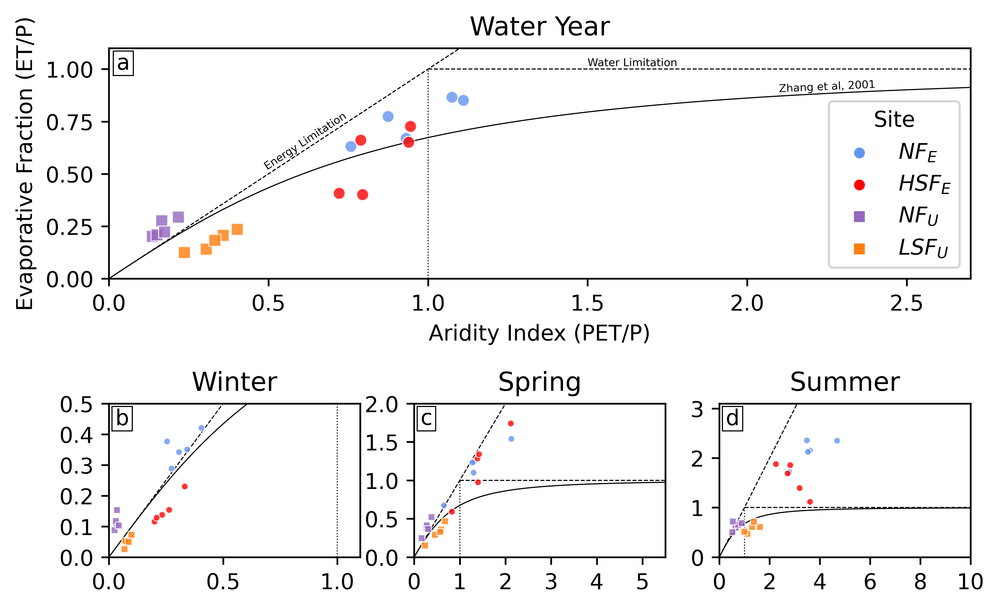

In [48]:
#### Create subplots and axes
fig, axs = plt.subplot_mosaic([['annual','annual','annual'], ['winter','spring','summer']], height_ratios=[3,2], figsize=(6.5, 4), dpi=600)

#### Design elements
site_renaming_dict = {
    "NF_eco": r"$NF_E$",
    "NF_und": r"$NF_U$",
    "SF_eco": r"$HSF_E$",
    "UF_und": r"$LSF_U$",
}
site_color_dict = {
    "NF_eco": "cornflowerblue",
    "NF_und": "C4",
    "SF_eco": "red",
    "UF_und": "C1",
}
site_marker_dict = {
    "NF_eco": "o",
    "NF_und": "s",
    "SF_eco": "o",
    "UF_und": "s",
}

# axs['spring'].tick_params('y', labelleft=False)
# axs['summer'].tick_params('y', labelleft=False)

axs["annual"].set_title("Water Year")
axs["annual"].set_xlabel("Aridity Index (PET/P)")
axs["annual"].set_ylabel("Evaporative Fraction (ET/P)")

axs["winter"].set_title("Winter")
axs["spring"].set_title("Spring")
axs["summer"].set_title("Summer")

axs["annual"].scatter(-100, -100, lw=0.5, edgecolor="white", color=site_color_dict["NF_eco"], label=site_renaming_dict["NF_eco"], marker=site_marker_dict["NF_eco"], s=30)
axs["annual"].scatter(-100, -100, lw=0.5, edgecolor="white", color=site_color_dict["SF_eco"], label=site_renaming_dict["SF_eco"], marker=site_marker_dict["SF_eco"], s=30)
axs["annual"].scatter(-100, -100, lw=0.5, edgecolor="white", color=site_color_dict["NF_und"], label=site_renaming_dict["NF_und"], marker=site_marker_dict["NF_und"], s=30)
axs["annual"].scatter(-100, -100, lw=0.5, edgecolor="white", color=site_color_dict["UF_und"], label=site_renaming_dict["UF_und"], marker=site_marker_dict["UF_und"], s=30)

#### Theoretical lines
for ax in axs.values():
    x = np.logspace(-2, 2, 1001)
    ax.plot(x, ZDW_01(x, 1), color='k', lw=0.5, zorder=0)
    ax.plot([1, 100], [1, 1], 'k--', lw=0.5, zorder=0)
    ax.plot([0, 100], [0, 100], 'k--', lw=0.5, zorder=0)
    ax.plot([1, 1], [0, 1], 'k:', lw=0.5, zorder=0)
    # plt.text(ylim[1]/2, ylim[1]/2, "Energy Limitation", verticalalignment="bottom", horizontalalignment="left", rotation=45, transform_rotates_text=True, rotation_mode="anchor")
    # if 1 < ylim[1]:
    #     plt.text(xlim[1]/1.2, 1, "Water Limitation", verticalalignment="bottom", horizontalalignment="right", rotation=0, transform_rotates_text=True, rotation_mode="anchor")    

#### Main plots
def plot_budyko(flux_data, date_start, date_end, ax, s):
    annual_totals = compute_cumulative_flux_within_timespan(flux_data, date_start, date_end)
    
    arid_idx = annual_totals.filter(regex="^PET")/annual_totals[["P.anncum"]].values
    evap_idx = annual_totals.filter(regex="^ET")/annual_totals[["P.anncum"]].values

    print(date_start, date_end)

    y = evap_idx[sorted(evap_idx)].drop(columns='ET-UF_eco,allday.anncum').values.flatten()
    yhat = ZDW_01(arid_idx[sorted(arid_idx)].drop(columns='PET-UF_eco,allday.anncum'), 1).values.flatten()
    
    # print(np.sqrt(np.sum((y - yhat)**2)/y.shape[0]))
    
    for arid_c, evap_c in zip(sorted(arid_idx), sorted(evap_idx)):
        site = arid_c.split("-")[1].split(",")[0]
    
        if "UF_eco" not in site:
            ax.scatter(arid_idx[arid_c], evap_idx[evap_c], color=site_color_dict[site], edgecolor="white", zorder=1, lw=0.5, s=s, alpha=0.8, marker=site_marker_dict[site])
            
    return
    

plot_budyko(flux_data.loc[:"2023-10-01"].filter(regex="allday|P.anncum"), "2020-10-01", "2020-09-30", axs["annual"], s=30)
axs["annual"].text(0.5, 0.5*1.02, "Energy Limitation", fontsize=5, verticalalignment="bottom", horizontalalignment="left", rotation=45, transform_rotates_text=True, rotation_mode="anchor")
axs["annual"].text(1.5, 1.005, "Water Limitation", fontsize=5, verticalalignment="bottom", horizontalalignment="left")
axs["annual"].text(2.1, ZDW_01(2.1,1)*1.01, "Zhang et al, 2001", fontsize=5, verticalalignment="bottom", horizontalalignment="left", rotation=4, transform_rotates_text=True, rotation_mode="anchor")

axs["annual"].set_xlim(0, 2.7)
axs["annual"].set_ylim(0, 1.1)
axs["annual"].set_yticks(np.linspace(0, 1, 5))
axs["annual"].set_xticks(np.linspace(0, 2.5, 6))

plot_budyko(flux_data.loc[:"2023-10-01"].filter(regex="allday|P.anncum"), "2020-10-01", "2020-03-31", axs["winter"], s=9.5)
axs["winter"].set_xlim(0, 1.1)
axs["winter"].set_ylim(0, 0.5)
axs["winter"].set_yticks(np.linspace(0, 0.5, 6))
axs["winter"].set_xticks(np.linspace(0, 1, 3))

plot_budyko(flux_data.loc[:"2023-10-01"].filter(regex="allday|P.anncum"), "2020-04-01", "2020-06-30", axs["spring"], s=9.5)
axs["spring"].set_xlim(0, 5.5)
axs["spring"].set_ylim(0, 2)
axs["spring"].set_yticks(np.linspace(0, 2, 5))
axs["spring"].set_xticks(np.linspace(0, 5, 6))

plot_budyko(flux_data.loc[:"2023-10-01"].filter(regex="allday|P.anncum"), "2020-07-01", "2020-09-30", axs["summer"], s=9.5)
axs["summer"].set_xlim(0, 10)
axs["summer"].set_ylim(0, 3.1)
axs["summer"].set_yticks(np.linspace(0, 3, 4))
axs["summer"].set_xticks(np.linspace(0, 10, 6))

#### Final touches
axs["annual"].legend(title="Site")
fig.tight_layout(w_pad=0.2, h_pad=1.2)

label_subplot(axs["annual"], "a", left_pad=0.009, top_pad=0.02)
label_subplot(axs["winter"], "b", 0.025, 0.03)
label_subplot(axs["spring"], "c", 0.025, 0.03)
label_subplot(axs["summer"], "d", 0.025, 0.03)

fig.savefig("figs/budyko.png")
pass;

## Uptake Depth Plot

* Dodge sites
* Vertical lines separate seasons

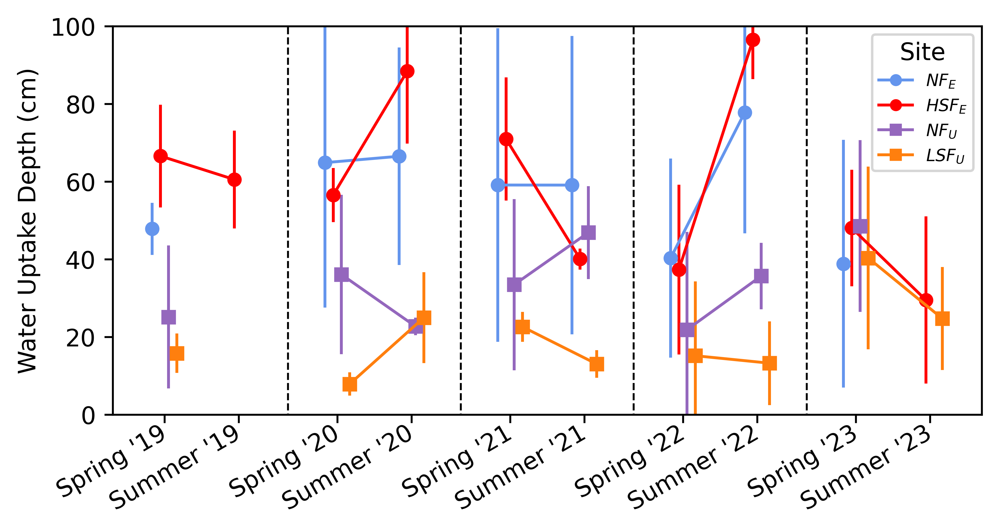

In [49]:
fig = plt.figure(figsize=(6.5,3), dpi=600)
ax = fig.add_subplot(111)

#### Design elements
site_renaming_dict = {
    "NF_eco": r"$NF_E$",
    "NF_und": r"$NF_U$",
    "SF_eco": r"$HSF_E$",
    "UF_und": r"$LSF_U$",
}
site_order = {
    "NF_eco": 0,
    "NF_und": 1,
    "SF_eco": 2,
    "UF_und": 3,
}
site_color_dict = {
    "NF_eco": "cornflowerblue",
    "NF_und": "C4",
    "SF_eco": "red",
    "UF_und": "C1",
}

def paired_errbar_plot(y:np.ndarray, yerr:np.ndarray, ax, dodge=0, gapsize=1, **kwargs):
    """y: 1d array to plot
    yerr: 1d array to plot errorbars
    dodge: added to each x point to "dodge" points horizontally
    gapsize: horizontal distance between the end of one pair and the start of another
    ax: matplotlib axis
    **kwargs: arguments passed to plt.plot()"""
    
    y = np.atleast_1d(y)
    yerr = np.atleast_1d(yerr)
    assert y.ndim == 1, "y must be 1d"
    assert yerr.shape == y.shape, "y and yerr must be same shape"
    
    if y.shape[0] % 2 != 0:
        y = np.concatenate((y, [np.nan]))
        yerr = np.concatenate((yerr, [np.nan]))

    # generate x values and gaps
    x = []
    gaps = []
    i = 0
    ix = 0
    while len(x) < y.shape[0]:
        if i%3 != 2:
            x.append(ix)
            ix += 1
        else:
            ix += gapsize - 1
            gaps.append(ix - gapsize/2)
        i += 1
    x = np.atleast_1d(x)
    gaps = np.atleast_1d(gaps)
    
    y2 = y.reshape((2, y.shape[0]//2), order="F").T
    yerr2 = yerr.reshape((2, yerr.shape[0]//2), order="F").T
    x2 = x.reshape((2, x.shape[0]//2), order="F").T
    for ix, iy, iyerr in zip(x2, y2, yerr2):
        ax.errorbar(ix + dodge, iy, iyerr, **kwargs)
    return ax, x, gaps

gapsize = 4/3
headroom = 2/3
dodge = -0.5 + headroom/2

df = best_depths.drop(columns=["TIMESTAMP", "UF_eco"])
df_err = best_depth_stderrs.drop(columns=["TIMESTAMP", "UF_eco"])
for (site, y), (_, yerr) in zip(df.items(), df_err.items()):
    ax, x, gaps = paired_errbar_plot(
        y.values.flatten(), 
        yerr.values.flatten(), 
        dodge=dodge, 
        ax=ax, 
        gapsize=gapsize, 
        color=site_color_dict[site], lw=1.2, elinewidth=1.2, markersize=4, markeredgewidth=2, marker=site_marker_dict[site])

    ax.plot(2, -1000, linestyle='-', color=site_color_dict[site], label=site_renaming_dict[site], lw=1.2, markersize=4, marker=site_marker_dict[site])
    dodge += (1 - headroom)/(df.shape[1] - 1)

ax.vlines(gaps, -1000, 1000, 'k', '--', lw=0.8)




xlabs = best_depths.sort_values("TIMESTAMP").index
xlabs = [f"Spring '{int(ix.split(' ')[1])%2000}" if "Spring" in ix else f"Summer '{int(ix.split(' ')[1])%2000}" for ix in xlabs]
ax.set_xticks(x, xlabs, rotation=30, verticalalignment="center", horizontalalignment="right", rotation_mode="anchor")
ax.legend(title="Site", fontsize=7)
ax.set_ylim(0, 100);

ax.set_ylabel("Water Uptake Depth (cm)")

fig.subplots_adjust(bottom=0.2, top=0.95)
fig.savefig("figs/uptake_depth_ts.png");


## Budyko-Effective Soil Moisture

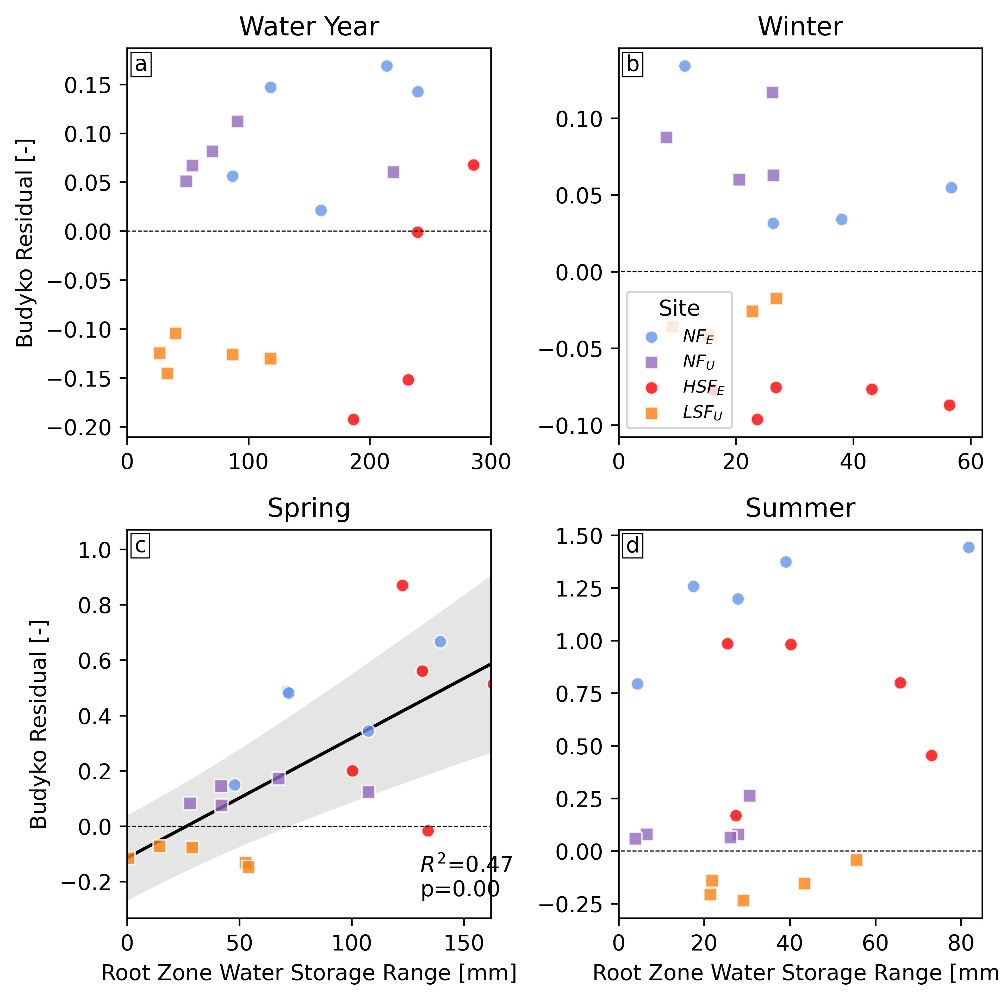

In [50]:
site_renaming_dict = {
    "NF_eco": r"$NF_E$",
    "NF_und": r"$NF_U$",
    "SF_eco": r"$HSF_E$",
    "UF_und": r"$LSF_U$",
}
site_color_dict = {
    "NF_eco": "cornflowerblue",
    "NF_und": "C4",
    "SF_eco": "red",
    "UF_und": "C1",
}
site_marker_dict = {
    "NF_eco": "o",
    "NF_und": "s",
    "SF_eco": "o",
    "UF_und": "s",
}
def compute_mean_flux_within_timespan(flux_data, date_start, date_end, regex):
    # fundamental theorem of calculus to compute total flux between date_start and date_end
    tminus_start, tminus_end = 366 - pd.to_datetime([date_start, date_end]).dayofyear
    
    starts = pd.date_range("2019-01-01", "2025-12-31", freq="1YE") - pd.Timedelta(f"{tminus_start}d")
    if int(date_start.split("-")[1]) >= 10:
        starts = pd.date_range("2019-01-01", "2025-01-01", freq="YS") - pd.Timedelta(f"{tminus_start}d")
    
    ends = pd.date_range("2019-01-01", "2025-12-31", freq="1YE") - pd.Timedelta(f"{tminus_end}d")
    if int(date_end.split("-")[1]) >= 10: 
        ends = pd.date_range("2019-01-01", "2025-01-01", freq="1YS") - pd.Timedelta(f"{tminus_end}d")
        
    while (starts[-1] not in flux_data.index) or (ends[-1] not in flux_data.index):
        starts = starts[:-1]
        ends = ends[:-1]

    dfs = []
    for start, end in zip(starts, ends):
        df = pd.DataFrame(flux_data.filter(regex=regex).loc[start:end].max()).T - pd.DataFrame(flux_data.filter(regex=regex).loc[start:end].min()).T
        df["t_start"] = start
        df["t_end"] = end
        dfs.append(df)
    mean = pd.concat(dfs)
    return mean
def fig5(flux_data, date_start, date_end, regex, ax):
    annual_totals = compute_cumulative_flux_within_timespan(flux_data, date_start, date_end)
    annual_means = compute_mean_flux_within_timespan(flux_data, date_start, date_end, regex)
    soil_means = annual_totals.merge(annual_means, on=["t_start", "t_end"]).filter(regex=regex)
    
    arid_idx = (annual_totals.filter(regex="^PET")/annual_totals[["P.anncum"]].values).filter(regex="allday")
    evap_idx = (annual_totals.filter(regex="^ET")/annual_totals[["P.anncum"]].values).filter(regex="allday")
    theory = ZDW_01(annual_totals.filter(regex="^PET"), annual_totals[["P.anncum"]].values).filter(regex="allday")
    banom = evap_idx[sorted(evap_idx)] - theory[sorted(theory)].values
    banom = banom.drop(columns="ET-UF_eco,allday.anncum")
    
    y = banom
    
    xarr = soil_means[sorted(soil_means)].values.flatten()
    yarr = y[sorted(y)].values.flatten()
    filter = ~(np.isnan(xarr) | np.isnan(yarr))
    xarr = xarr[filter]
    yarr = yarr[filter]
    reg = stats.linregress(xarr, yarr)
    if reg.pvalue < 0.05:
        xsim = np.linspace(0, xarr.max()*1.1)
        ysim = xsim*reg.slope + reg.intercept
        slope_samples = stats.norm(reg.slope, reg.stderr).rvs(size=(1, 10_000))
        int_samples = stats.norm(reg.intercept, reg.intercept_stderr).rvs(size=(1, 10_000))
        yerr = (xsim[:, np.newaxis]*slope_samples + int_samples).std(1)
        
        ax.plot(xsim*1000, ysim, color='k', zorder=0)
        ax.fill_between(xsim*1000, ysim - yerr*1.6, ysim + yerr*1.6, color='k', alpha=0.1, lw=0, zorder=0)
        ax.text(xarr.max()*0.8*1000, min((yarr.min(), (ysim-yerr*1.6).min())), f"$R^2$={reg.rvalue**2:.2f}\np={reg.pvalue:.2f}", verticalalignment="bottom", )
    for y_c, soil_c in zip(sorted(y), sorted(soil_means)):
        site = soil_c.split("-")[1].split(",")[0]
        if "UF_eco" not in site:
            ax.scatter(soil_means[soil_c]*1000, y[y_c], color=site_color_dict[site], edgecolor="white", marker=site_marker_dict[site], zorder=1, lw=0.8, alpha=0.8, label=site_renaming_dict[site])
    return ax, ax.get_xlim()

fig, axs = plt.subplots(2, 2, figsize=(6.5, 6.5), dpi=600)

regex = "Seff"

date_start, date_end = "2020-10-02", "2020-09-29"
ax, xlim = fig5(flux_data.loc[:"2023-10-01"], date_start, date_end, regex, axs[0, 0])
ax.hlines(0, -10000, 10000, 'k', '--', lw=0.5)
ax.set_xlim(0, 300)
ax.set_title("Water Year")

date_start, date_end = "2020-10-02", "2020-03-31"
ax, xlim = fig5(flux_data.loc[:"2023-10-01"], date_start, date_end, regex, axs[0, 1])
ax.hlines(0, -10000, 10000, 'k', '--', lw=0.5)
ax.set_xlim(0, 62)
ax.set_title("Winter")
ax.legend(title="Site", loc="lower left", fontsize=8)

date_start, date_end = "2020-04-01", "2020-06-30"
ax, xlim = fig5(flux_data.loc[:"2023-10-01"], date_start, date_end, regex, axs[1, 0])
ax.hlines(0, -10000, 10000, 'k', '--', lw=0.5)
ax.set_xlim(0, 162)
ax.set_title("Spring")

date_start, date_end = "2020-07-01", "2020-09-29"
ax, xlim = fig5(flux_data.loc[:"2023-10-01"], date_start, date_end, regex, axs[1, 1])
ax.hlines(0, -10000, 10000, 'k', '--', lw=0.5)
ax.set_xlim(0, 85)
ax.set_title("Summer")

axs[0, 0].set_ylabel("Budyko Residual [-]")
axs[1, 0].set_ylabel("Budyko Residual [-]")
axs[1, 0].set_xlabel("Root Zone Water Storage Range [mm]")
axs[1, 1].set_xlabel("Root Zone Water Storage Range [mm]")
fig.tight_layout()

label_subplot(axs[0, 0], "a")
label_subplot(axs[0, 1], "b")
label_subplot(axs[1, 0], "c")
label_subplot(axs[1, 1], "d")

fig.savefig("figs/budyko-soil-range.png")

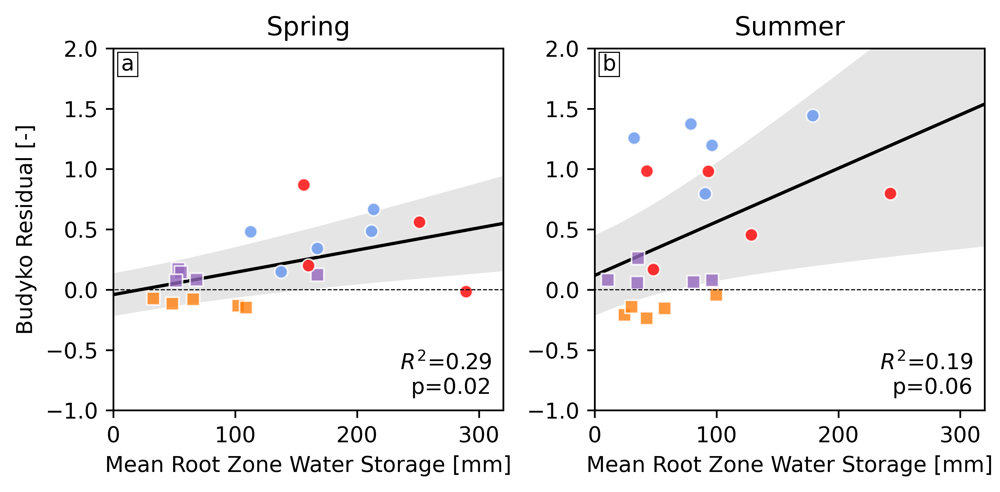

In [51]:
site_renaming_dict = {
    "NF_eco": r"$NF_E$",
    "NF_und": r"$NF_U$",
    "SF_eco": r"$HSF_E$",
    "UF_und": r"$LSF_U$",
}
site_color_dict = {
    "NF_eco": "cornflowerblue",
    "NF_und": "C4",
    "SF_eco": "red",
    "UF_und": "C1",
}
site_marker_dict = {
    "NF_eco": "o",
    "NF_und": "s",
    "SF_eco": "o",
    "UF_und": "s",
}
def compute_mean_flux_within_timespan(flux_data, date_start, date_end, regex):
    # fundamental theorem of calculus to compute total flux between date_start and date_end
    tminus_start, tminus_end = 366 - pd.to_datetime([date_start, date_end]).dayofyear
    
    starts = pd.date_range("2019-01-01", "2025-12-31", freq="1YE") - pd.Timedelta(f"{tminus_start}d")
    if int(date_start.split("-")[1]) >= 10:
        starts = pd.date_range("2019-01-01", "2025-01-01", freq="YS") - pd.Timedelta(f"{tminus_start}d")
    
    ends = pd.date_range("2019-01-01", "2025-12-31", freq="1YE") - pd.Timedelta(f"{tminus_end}d")
    if int(date_end.split("-")[1]) >= 10: 
        ends = pd.date_range("2019-01-01", "2025-01-01", freq="1YS") - pd.Timedelta(f"{tminus_end}d")
        
    while (starts[-1] not in flux_data.index) or (ends[-1] not in flux_data.index):
        starts = starts[:-1]
        ends = ends[:-1]

    dfs = []
    for start, end in zip(starts, ends):
        df = pd.DataFrame(flux_data.filter(regex=regex).loc[start:end].mean()).T
        df["t_start"] = start
        df["t_end"] = end
        dfs.append(df)
    mean = pd.concat(dfs)
    return mean
def fig5(flux_data, date_start, date_end, regex, ax):
    annual_totals = compute_cumulative_flux_within_timespan(flux_data, date_start, date_end)
    annual_means = compute_mean_flux_within_timespan(flux_data, date_start, date_end, regex)
    soil_means = annual_totals.merge(annual_means, on=["t_start", "t_end"]).filter(regex=regex)
    
    arid_idx = (annual_totals.filter(regex="^PET")/annual_totals[["P.anncum"]].values).filter(regex="allday")
    evap_idx = (annual_totals.filter(regex="^ET")/annual_totals[["P.anncum"]].values).filter(regex="allday")
    theory = ZDW_01(annual_totals.filter(regex="^PET"), annual_totals[["P.anncum"]].values).filter(regex="allday")
    banom = evap_idx[sorted(evap_idx)] - theory[sorted(theory)].values
    banom = banom.drop(columns="ET-UF_eco,allday.anncum")

    y = banom
    
    xarr = soil_means[sorted(soil_means)].values.flatten()
    yarr = y[sorted(y)].values.flatten()
    filter = ~(np.isnan(xarr) | np.isnan(yarr))
    xarr = xarr[filter]
    yarr = yarr[filter]
    reg = stats.linregress(xarr, yarr)
    if reg.pvalue < 0.1:
        xsim = np.linspace(0, xarr.max()*2)
        ysim = xsim*reg.slope + reg.intercept
        slope_samples = stats.norm(reg.slope, reg.stderr).rvs(size=(1, 10_000))
        int_samples = stats.norm(reg.intercept, reg.intercept_stderr).rvs(size=(1, 10_000))
        yerr = (xsim[:, np.newaxis]*slope_samples + int_samples).std(1)
        
        ax.plot(xsim*1000, ysim, color='k', zorder=0)
        ax.fill_between(xsim*1000, ysim - yerr*1.6, ysim + yerr*1.6, color='k', alpha=0.1, lw=0, zorder=0)
        
        # ax.text(xarr.max()*0.8*1000, yarr.max()*0.9, f"$R^2$={reg.rvalue**2:.2f}\np={reg.pvalue:.2f}", verticalalignment="bottom", )
        ax.text(310, -0.9, f"$R^2$={reg.rvalue**2:.2f}\np={reg.pvalue:.2f}", verticalalignment="bottom", horizontalalignment="right")
    for y_c, soil_c in zip(sorted(y), sorted(soil_means)):
        site = soil_c.split("-")[1].split(",")[0]
        if "UF_eco" not in site:
            ax.scatter(soil_means[soil_c]*1000, y[y_c], color=site_color_dict[site], edgecolor="white", marker=site_marker_dict[site], zorder=1, lw=0.8, alpha=0.8, label=site_renaming_dict[site])
    return ax, ax.get_xlim()

fig, axs = plt.subplots(1, 2, figsize=(6.5, 3.25), dpi=600)
axs = axs.reshape((1, 2))

regex = "Seff"
# regex = "VWC.10"

# date_start, date_end = "2020-10-02", "2020-09-29"
# ax, xlim = fig5(flux_data.loc[:"2023-10-01"], date_start, date_end, regex, axs[0, 0])
# ax.hlines(0, -10000, 10000, 'k', '--', lw=0.5)
# ax.set_xlim(0, 320)
# ax.set_title("Water Year")
# ax.legend(title="Site", loc="center right", fontsize=8)

# date_start, date_end = "2020-10-02", "2020-03-31"
# ax, xlim = fig5(flux_data.loc[:"2023-10-01"], date_start, date_end, regex, axs[0, 1])
# ax.hlines(0, -10000, 10000, 'k', '--', lw=0.5)
# ax.set_xlim(0, 320)
# ax.set_ylim(-0.25, 0.12)
# ax.set_title("Winter")

date_start, date_end = "2020-04-01", "2020-06-30"
ax, xlim = fig5(flux_data.loc[:"2023-10-01"], date_start, date_end, regex, axs[0, 0])
ax.hlines(0, -10000, 10000, 'k', '--', lw=0.5)
ax.set_xlim(0, 320)
ax.set_ylim(-1, 2)
ax.set_title("Spring")

date_start, date_end = "2020-07-01", "2020-09-29"
ax, xlim = fig5(flux_data.loc[:"2023-10-01"], date_start, date_end, regex, axs[0, 1])
ax.hlines(0, -10000, 10000, 'k', '--', lw=0.5)
ax.set_xlim(0, 320)
ax.set_ylim(-1, 2)
ax.set_title("Summer")

axs[0, 0].set_ylabel("Budyko Residual [-]")
# axs[1, 0].set_ylabel("Budyko Residual [-]")
axs[0, 0].set_xlabel("Mean Root Zone Water Storage [mm]")
axs[0, 1].set_xlabel("Mean Root Zone Water Storage [mm]")

label_subplot(axs[0, 0], "a")
label_subplot(axs[0, 1], "b")
# label_subplot(axs[1, 0], "c")
# label_subplot(axs[1, 1], "d")

fig.tight_layout()
fig.savefig("figs/budyko-soil-mean.png")